In [26]:
import sys
sys.path.insert(0, '..')  # Adding parent folder so notebook find perturbseq_analysis.py
import perturbseq_analysis as pseq
from scipy.io import mmread
import pandas as pd
import xlrd

In [2]:
# Fetching the matrix counts; rows are cells and columns are genes
matrix = mmread('GSE161824_A549_TP53.rawcounts.matrix.mtx')  # This file was too big to be stores in GitHub; please download it from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE161824
matrix = matrix.todense()
matrix = pd.DataFrame(matrix)
matrix

,0,1,2,3,4,5,6,7,8,9,...,24858,24859,24860,24861,24862,24863,24864,24865,24866,24867
0,0,0,0,0,0,2,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162309,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
162310,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
162311,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,2
162312,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [3]:
# Loading the metadata with the variants assigned to each cell (rows)
obs_names = pd.read_csv('GSE161824_A549_TP53.variants2cell.csv', sep = '\t')['variant']
obs_names

0            G266E
1            G105C
2            G105C
3             P47P
4            G360V
            ...   
162309       R249M
162310       H179Y
162311       G266V
162312    multiple
162313       G245V
Name: variant, Length: 162314, dtype: object

In [4]:
# Loading the metadata with the batches that each cell belongs to
batch_nums = pd.read_csv('GSE161824_A549_TP53.variants2cell.csv', sep = '\t')['batch']
batch_nums

0          0
1          0
2          0
3          0
4          0
          ..
162309    31
162310    31
162311    31
162312    31
162313    31
Name: batch, Length: 162314, dtype: int64

In [5]:
# Filtering cells without an unique variant
len_index = len(matrix.index)
matrix = matrix[obs_names != 'multiple']    # Filtering cells annotated with multiple variants
matrix = matrix[obs_names != 'unassigned']  # Filtering cells with no variant annotation
matrix = matrix.reset_index(drop=True)
obs_names, batch_nums = zip(*[(variant, batch) for variant, batch in zip(obs_names, batch_nums) if variant not in ['multiple', 'unassigned']])
print('The %.2f%% of cells were filtered' % (len(matrix.index) / len_index * 100))  # Filtering list of variants

/tmp/ipykernel_22462/723879160.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  matrix = matrix[obs_names != 'unassigned']  # Filtering cells with no variant annotation


The 62.08% of cells were filtered


In [6]:
# Loading the metadata with the genes (HGNC nomenclature) assigned to each column
var_names = pd.read_csv('GSE161824_A549_TP53.rawcounts.genes.csv', header = None)[0]
var_names

0        RP11-34P13.3
1        RP11-34P13.7
2        RP11-34P13.8
3          FO538757.3
4          FO538757.2
             ...     
24863      AC007325.2
24864      AL354822.1
24865      AC023491.2
24866      AC004556.1
24867      AC240274.1
Name: 0, Length: 24868, dtype: object

In [7]:
# Fetching the names of mitochondrial genes (downloaded from MitoCarta3.0 database)
mt_names = pd.read_excel('../Human.MitoCarta3.0.xls', 'A Human MitoCarta3.0')['Symbol']
mt_names

0                CYC1
1                SDHB
2                COQ7
3                SDHA
4              UQCRC1
            ...      
1131            NAT8L
1132            MCCD1
1133          PIGBOS1
1134             HTD2
1135    RP11_469A15.2
Name: Symbol, Length: 1136, dtype: object

Generating metadata...


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


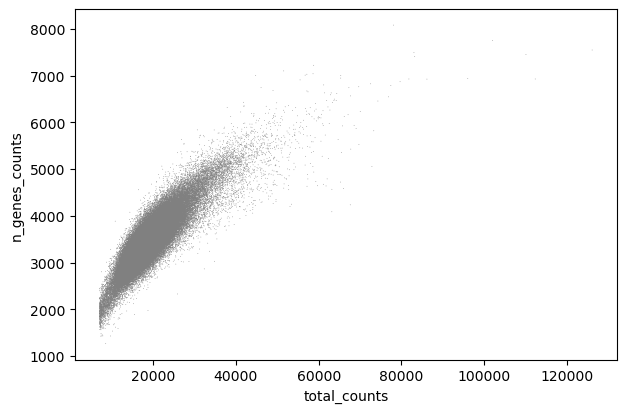

Introduce the minimum number of counts that cells must have:  7000
Introduce the maximum number of counts that cells must have:  50000
Introduce the median number of counts that batches must have:  20000


Downsampling cells with >50000 counts...
Downsampling batches...


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Filtering cells with <7000 counts...
Filtering cells with >20% mitochondrial counts...
Filtering cells with <200 genes


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:139: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Filtering genes present in <3 cells
Filtering 80% lowest variable genes


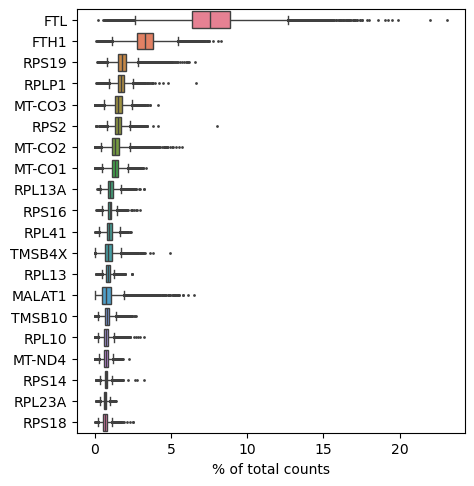

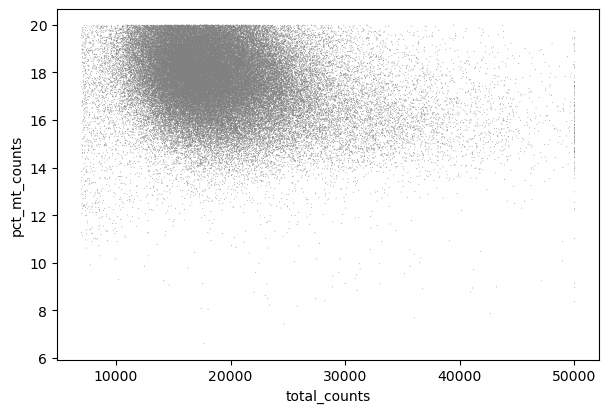

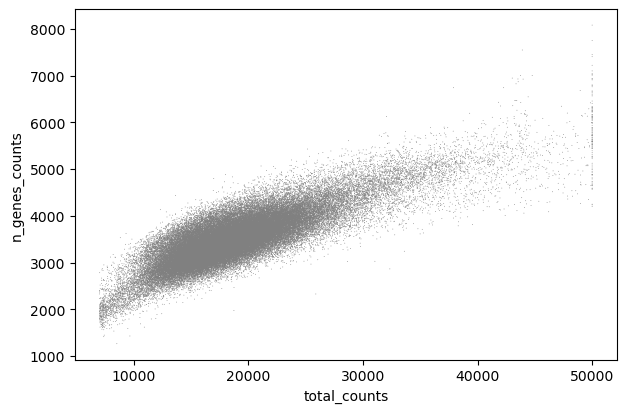

Execution time: 239.752 seconds


In [8]:
# Filtering data; check the documentation for more info
adata = pseq.filter_data(matrix, var_names, obs_names, mt_names, batch_nums)

In [9]:
##### CHECKPOINT: Recover output from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/filter_data.pkl', 'rb') as file:
    adata = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/filter_data.pkl', 'rb') as file:\n    adata = pkl.load(file)\n"

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n is deprecated and will be removed in Python 3.14; use value instead
  return node.n
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


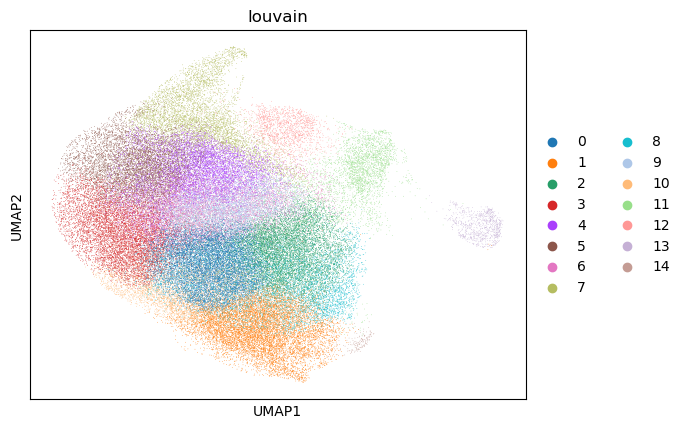

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
R158R,13.04,9.57,8.99,11.01,7.39,12.61,6.38,7.68,5.36,5.65,6.52,3.48,2.03,0.29,0.0
E339K,9.97,7.04,7.92,10.56,9.38,9.97,9.68,10.56,4.11,7.04,5.57,4.4,2.93,0.88,0.0
V173M,11.95,12.08,10.6,8.05,9.93,6.44,8.05,5.5,6.58,7.65,5.37,5.1,1.48,0.94,0.27
R273H,10.18,11.74,8.63,8.06,10.75,9.34,7.36,8.06,6.36,6.65,6.08,3.96,1.27,1.13,0.42
S241C,12.95,12.17,9.2,7.33,8.11,9.05,7.49,8.42,6.24,4.06,6.08,5.62,2.5,0.78,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R273C,11.88,9.12,8.01,8.75,11.51,10.68,7.73,10.77,4.05,8.2,3.13,3.78,1.47,0.83,0.09
G360V,10.91,11.27,12.18,8.18,5.64,10.0,5.27,8.36,6.18,6.91,6.18,5.64,1.82,1.45,0.0
P153P,10.73,11.07,9.03,9.2,8.01,11.75,5.62,8.86,6.13,7.67,5.79,3.58,1.7,0.85,0.0
R213Q,13.07,11.11,7.19,9.54,7.84,10.59,8.63,4.97,6.27,8.1,3.53,4.97,2.61,1.57,0.0


Execution time: 166.674 seconds


In [10]:
# Louvain clustering of cells, and calculate the variant presence (%) in each louvain group
adata = pseq.louvain_cells(adata)

The phenotypic impact of variants is complex and may not result in distinct clusters in the single-cell RNA-seq data. Instead, the functional impact may manifest as a spectrum of gene expression changes, making it challenging to define clear boundaries between clusters. Shall we continue with further network propagation exploration? Of course, "Genetic variants or mutations that otherwise would not pass a test for statistical significance, due to low power of association with the disease phenotype, can be prioritized due to their close association with each other in molecular networks".

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


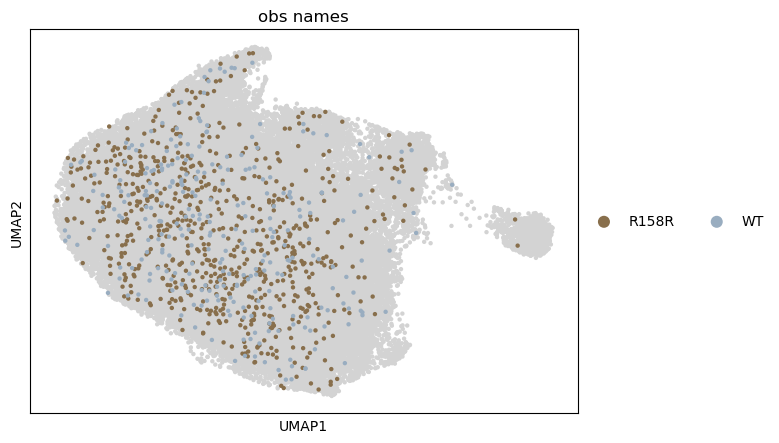

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


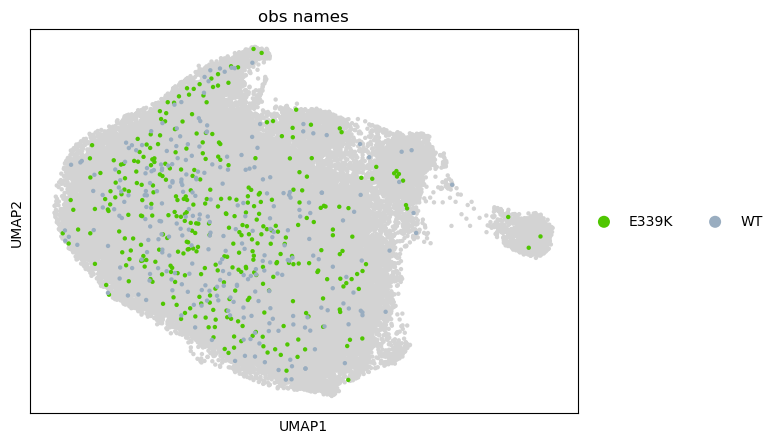

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


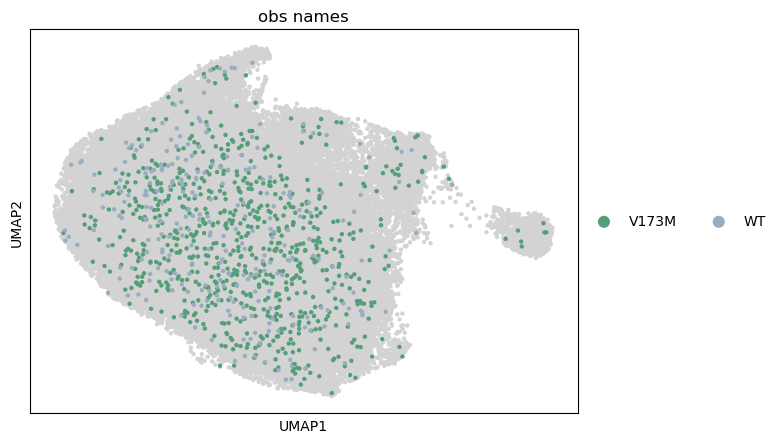

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


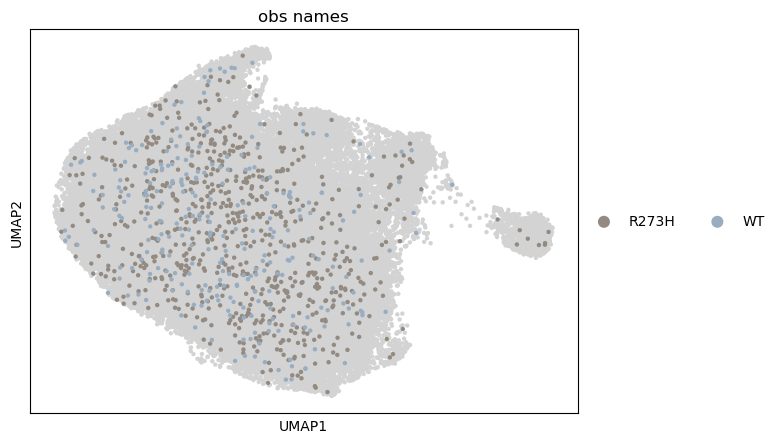

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


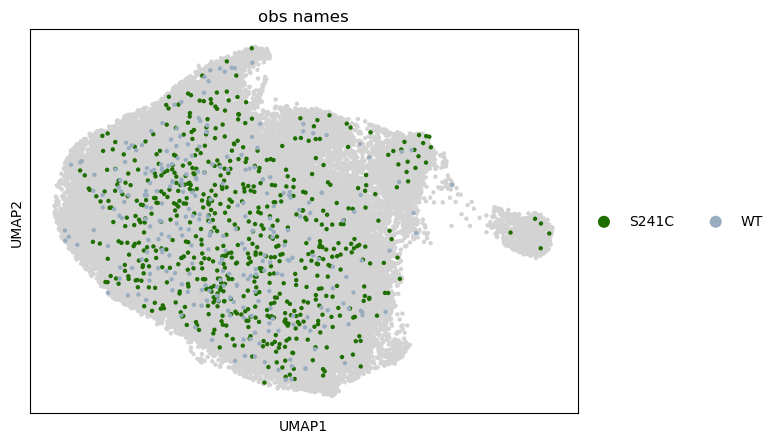

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


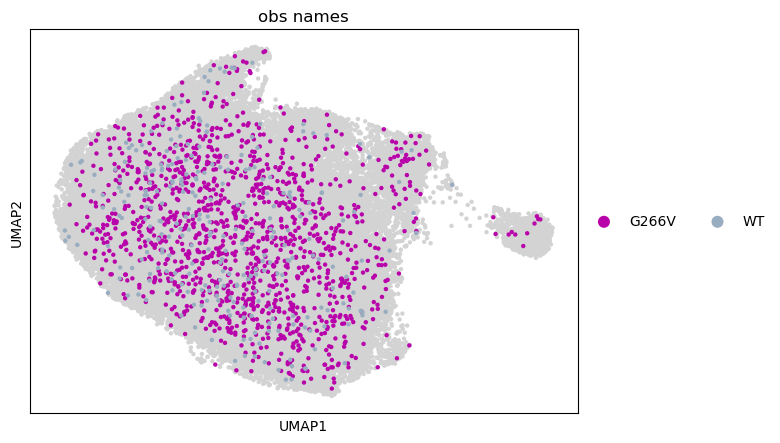

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


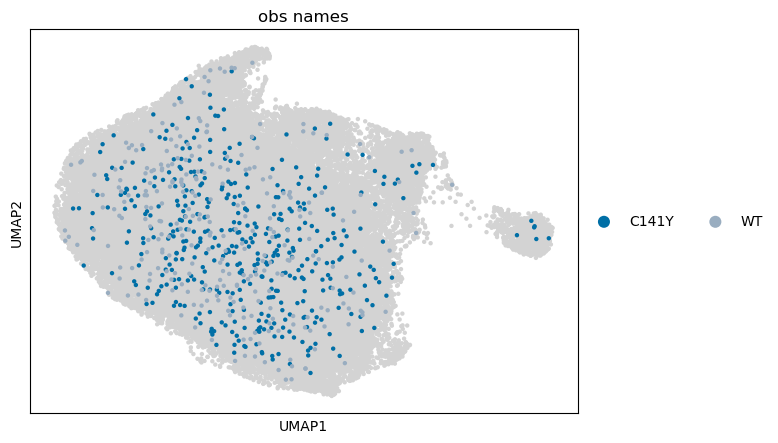

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


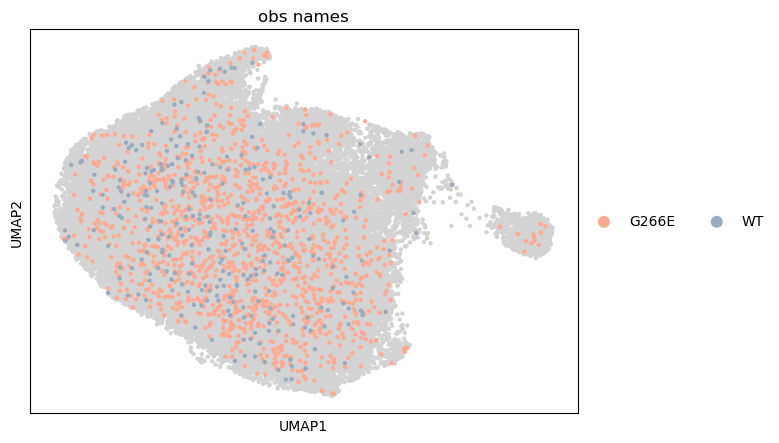

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


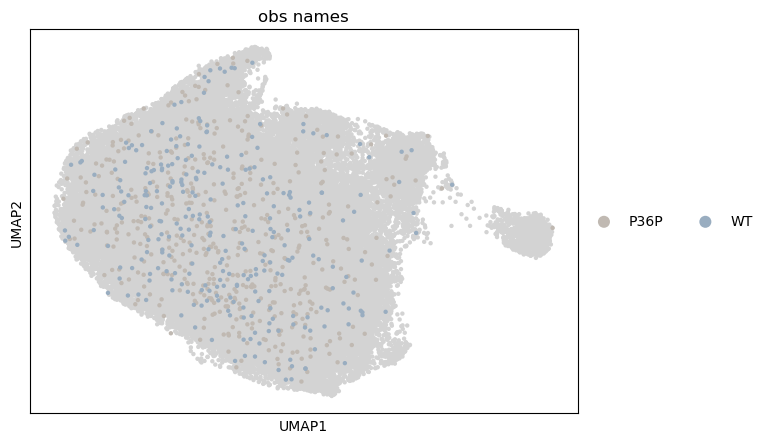

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


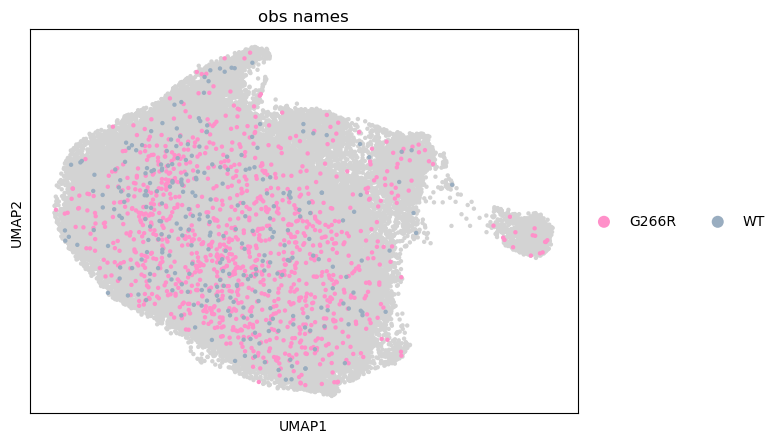

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


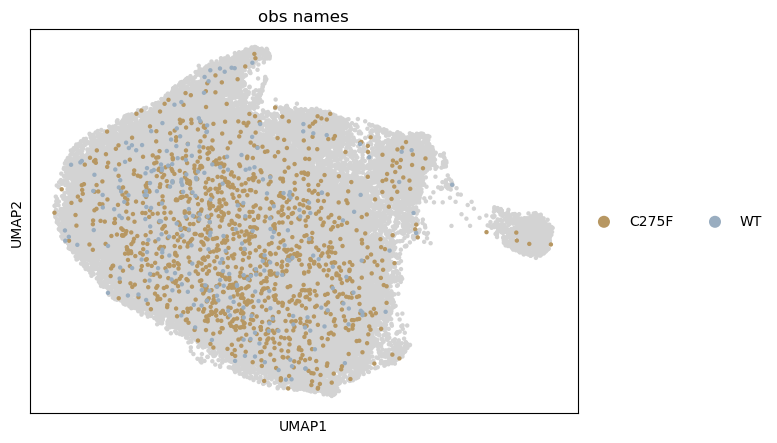

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


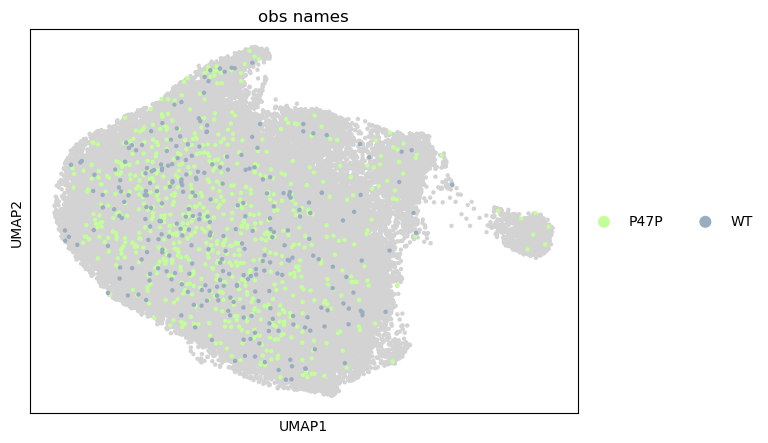

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


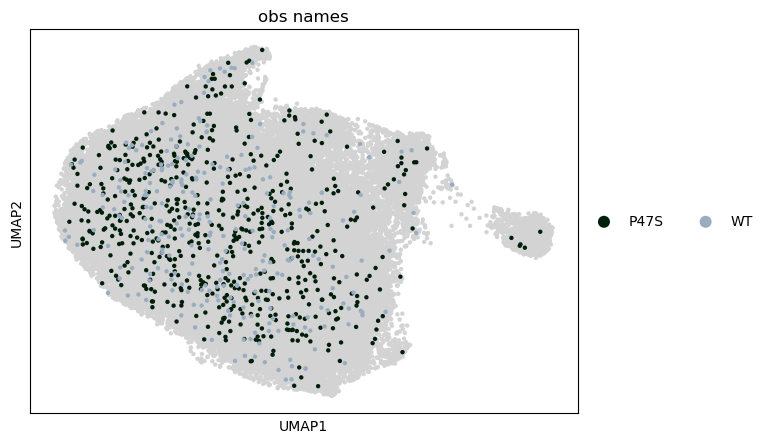

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


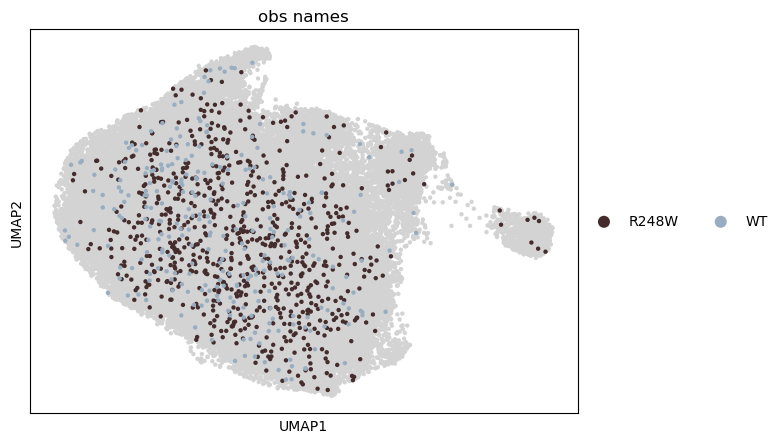

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


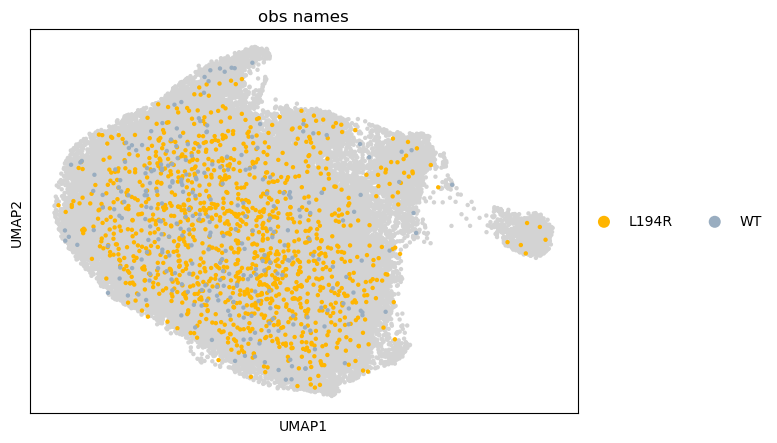

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


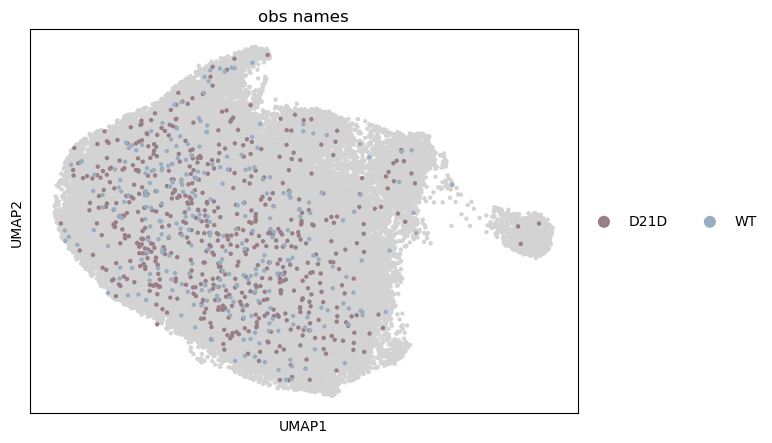

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


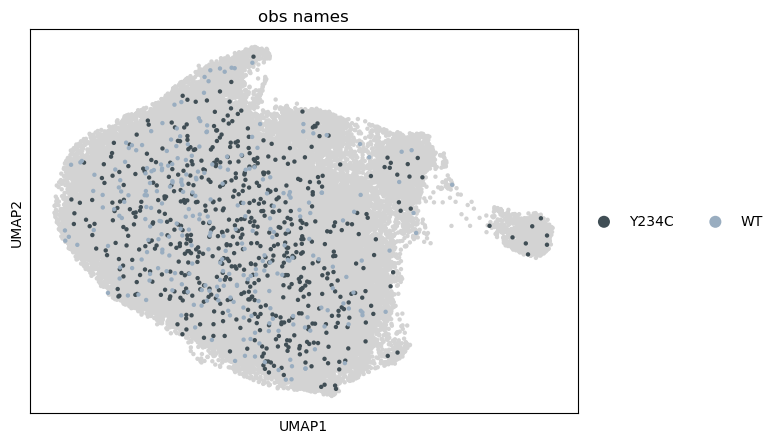

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


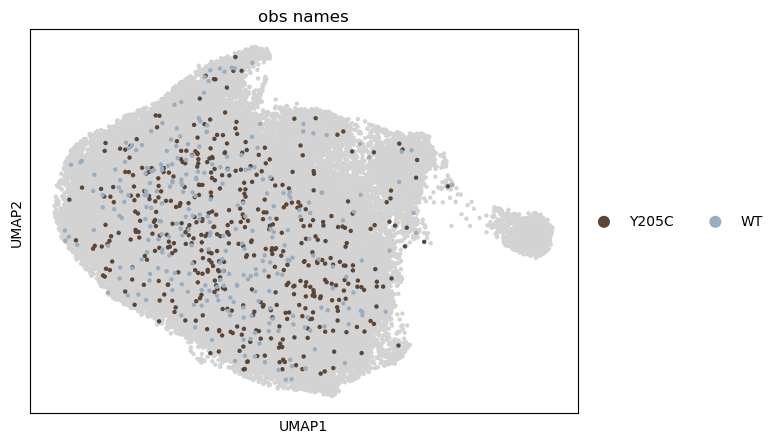

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


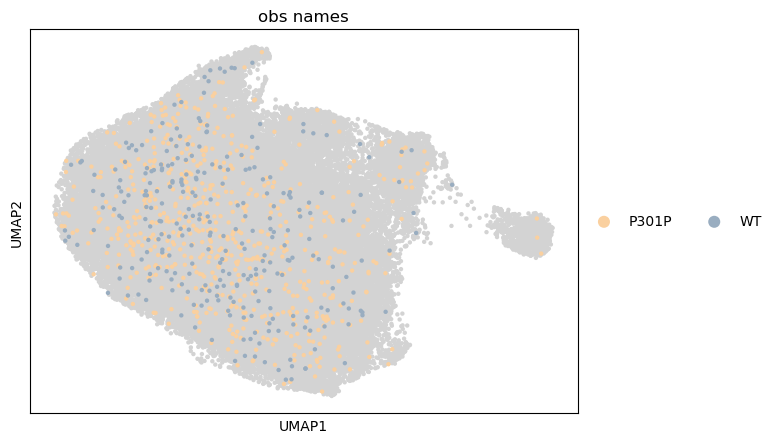

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


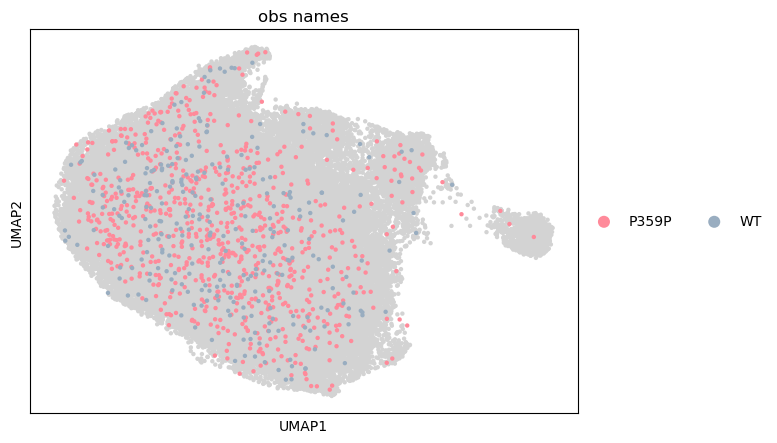

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


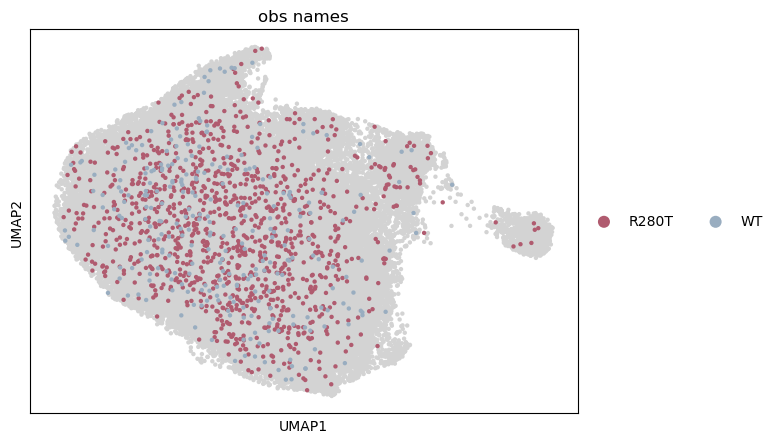

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


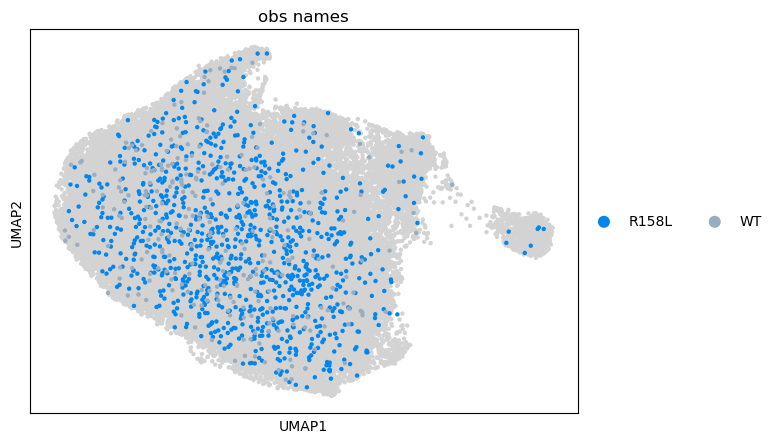

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


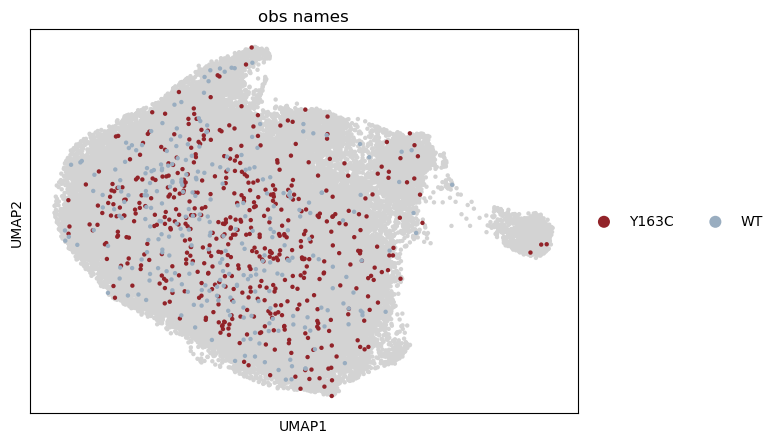

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


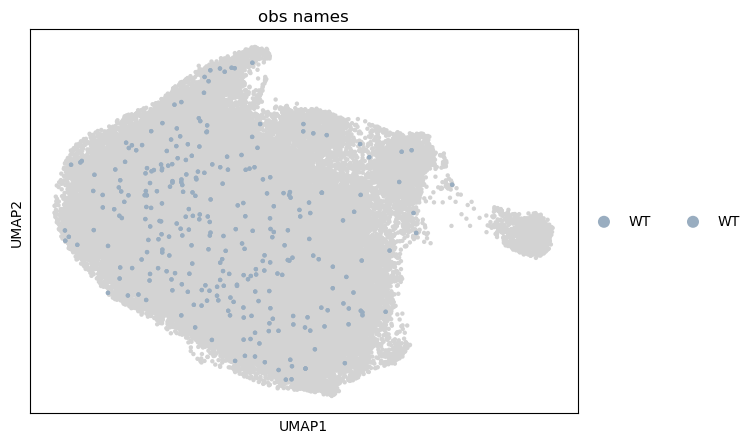

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


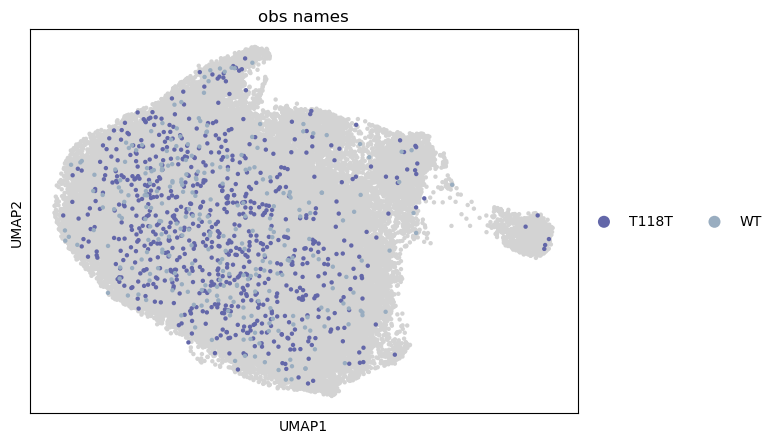

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


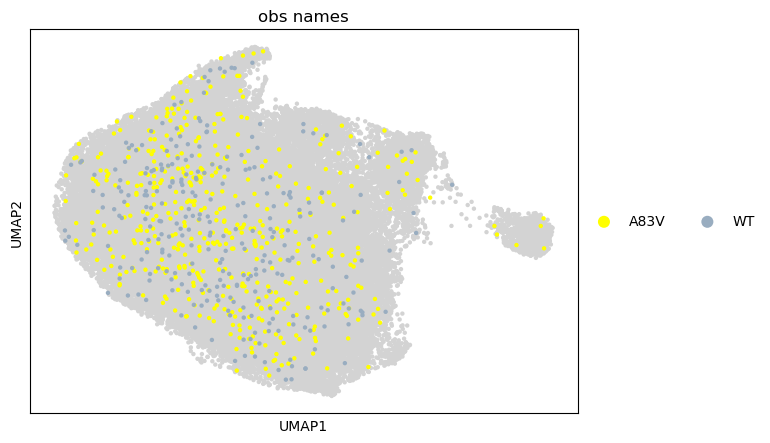

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


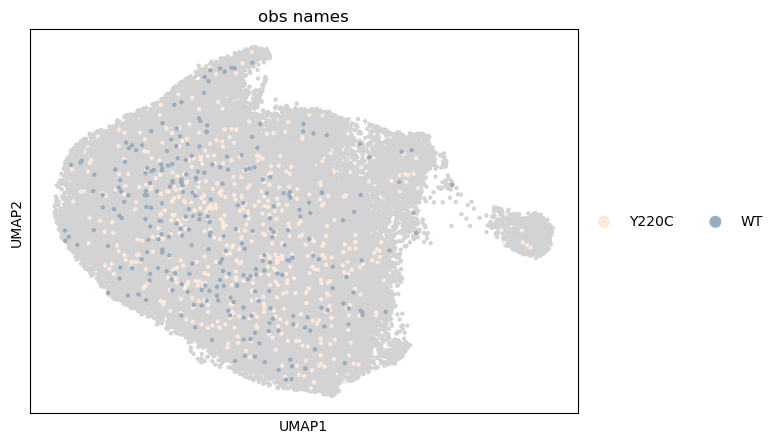

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


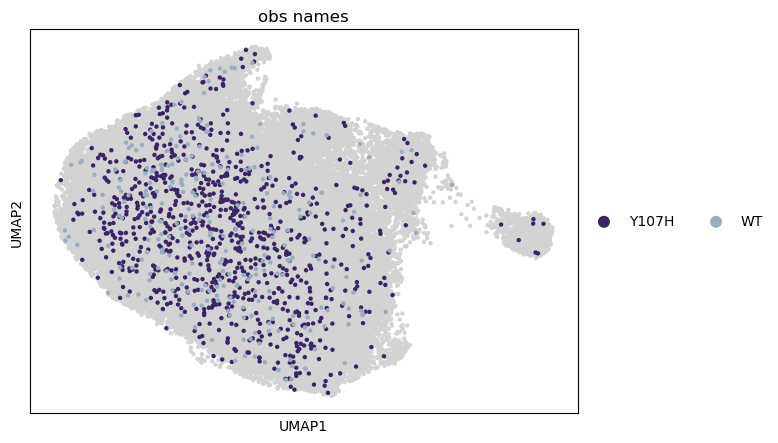

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


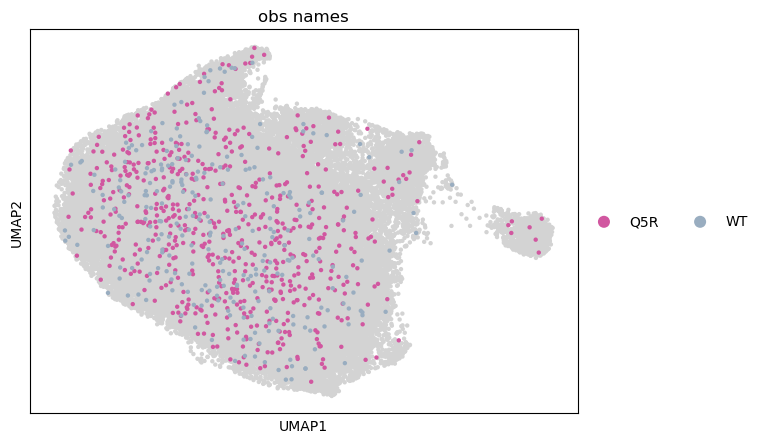

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


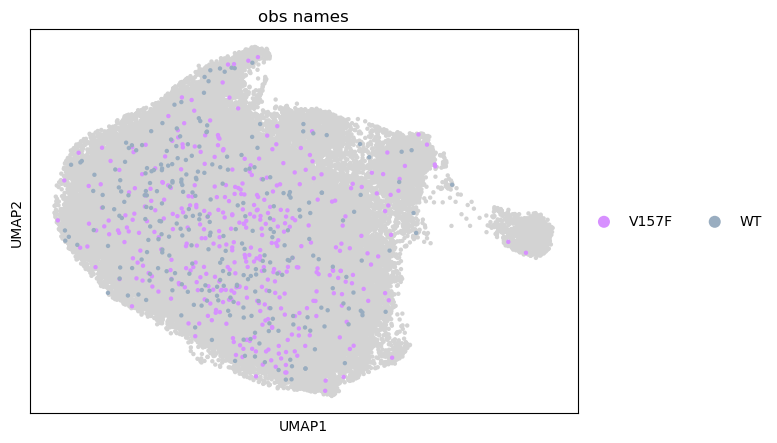

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


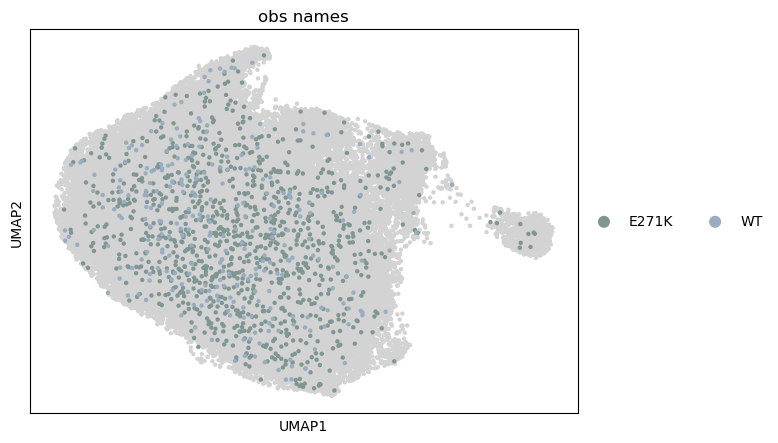

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


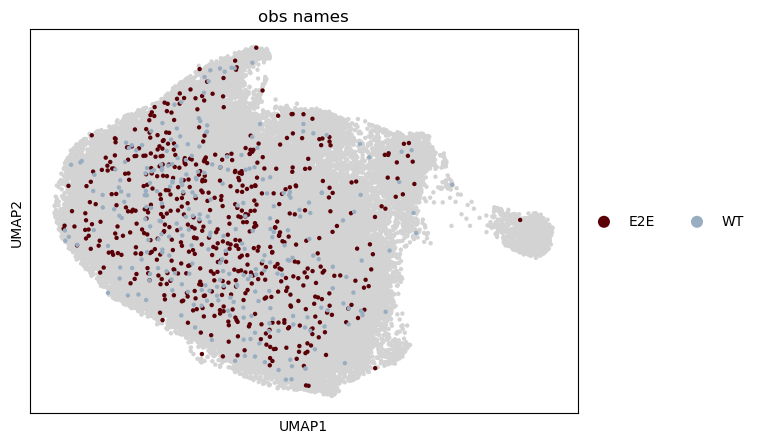

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


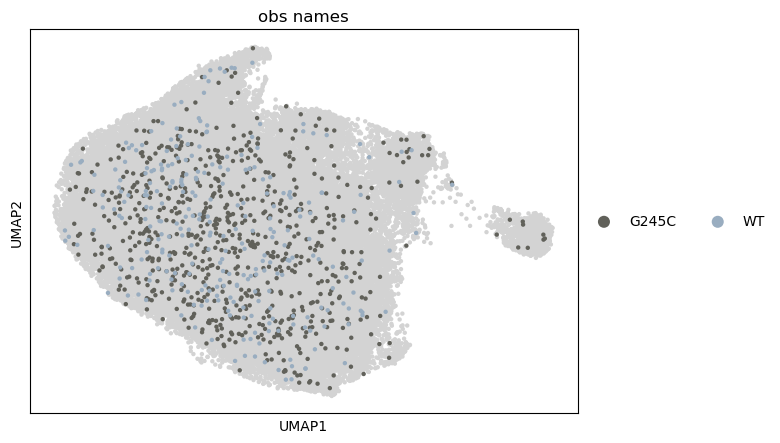

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


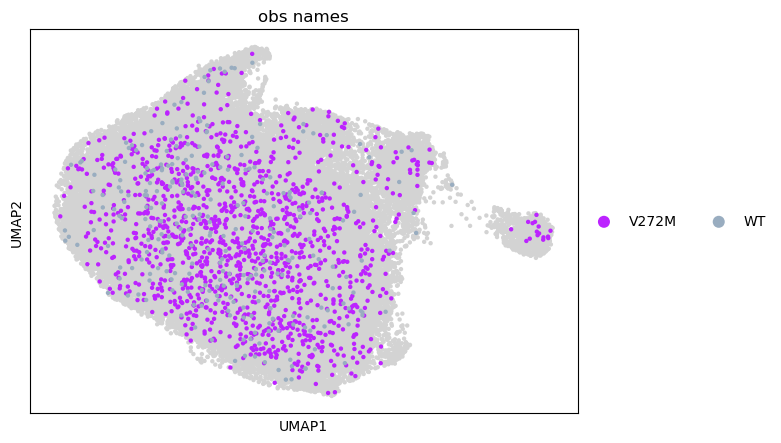

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


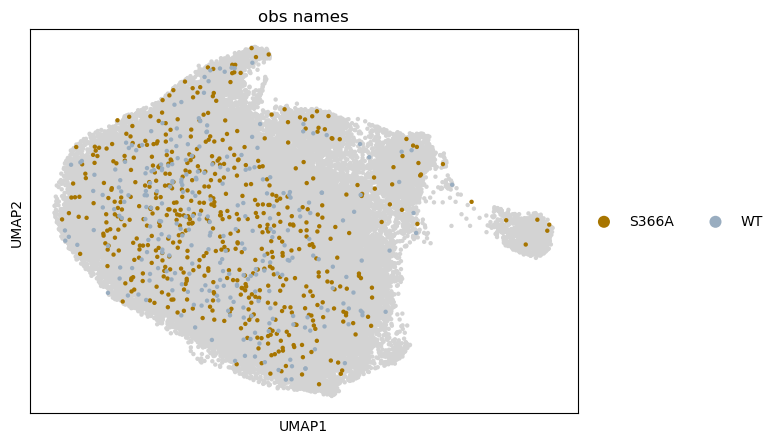

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


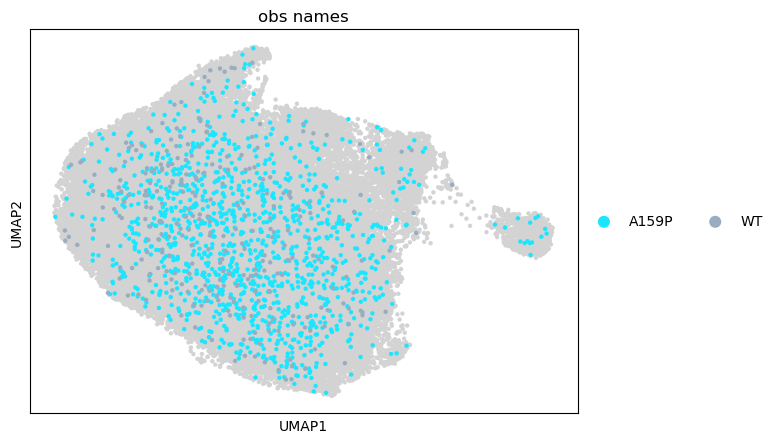

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


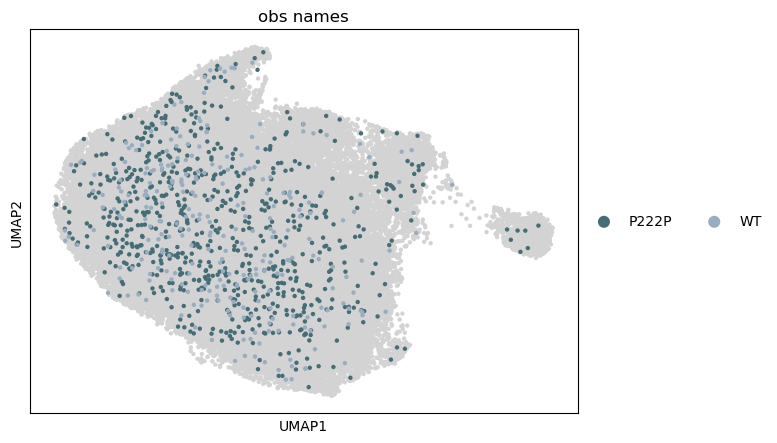

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


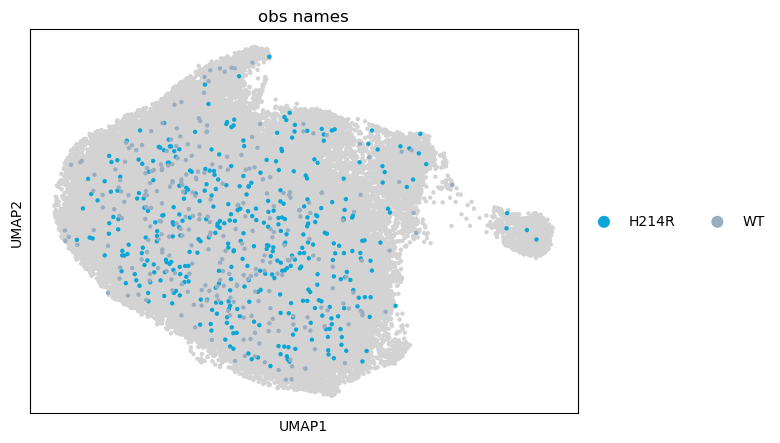

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


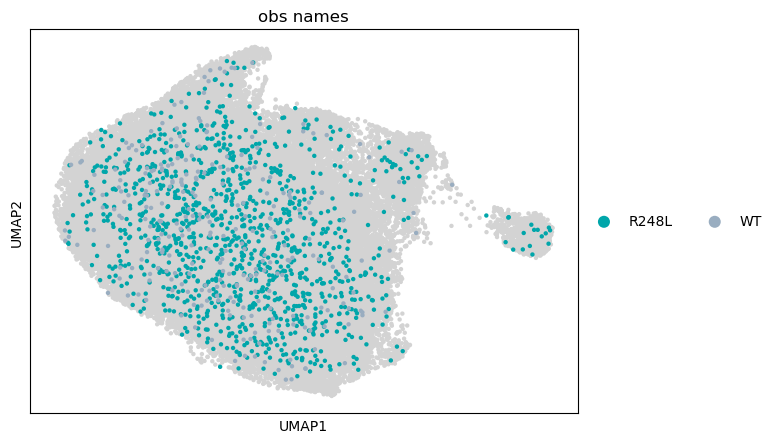

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


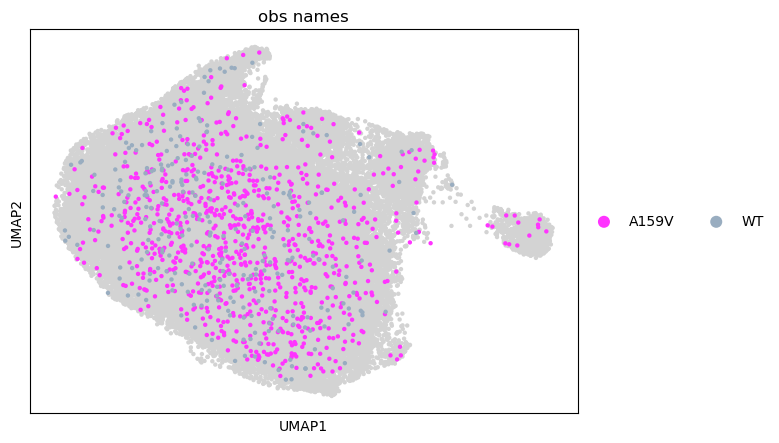

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


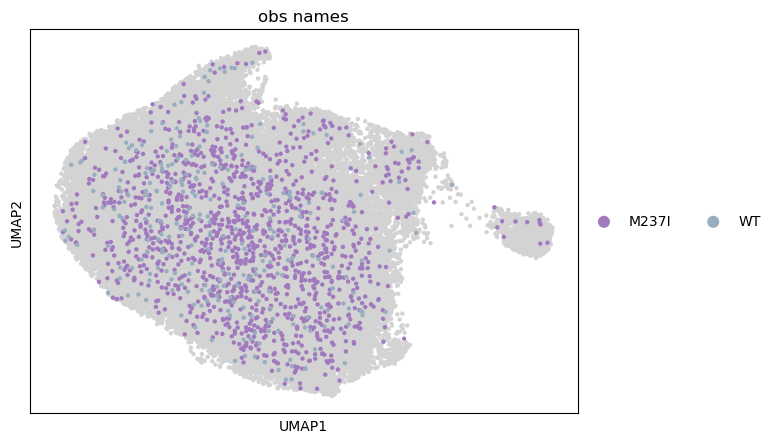

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


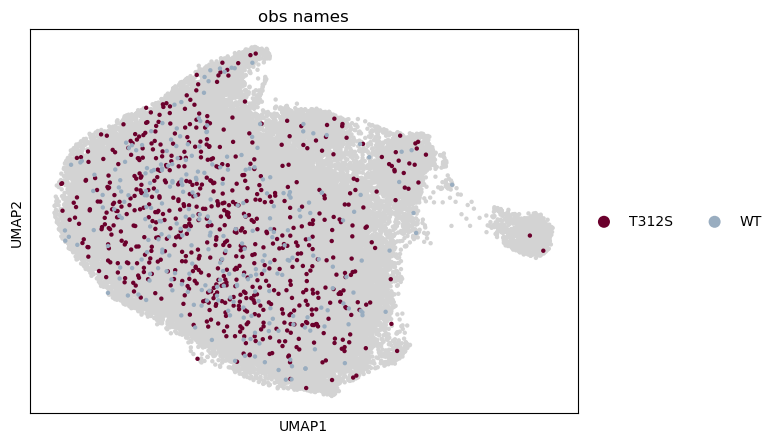

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


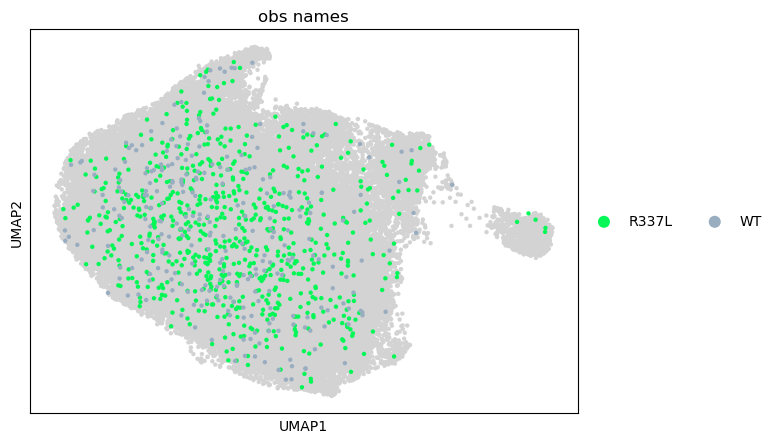

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


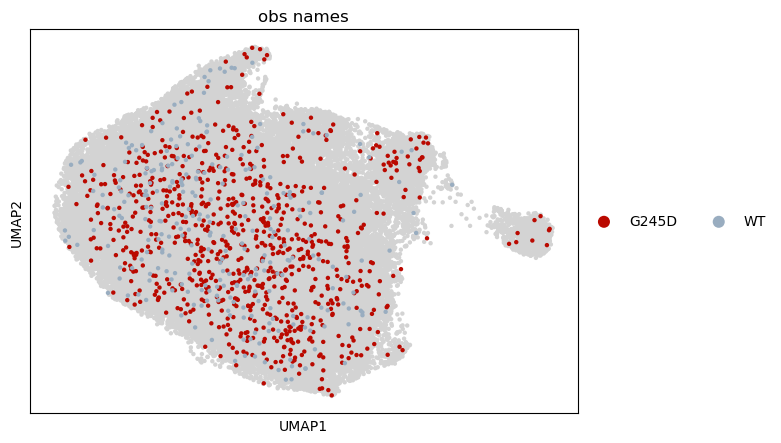

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


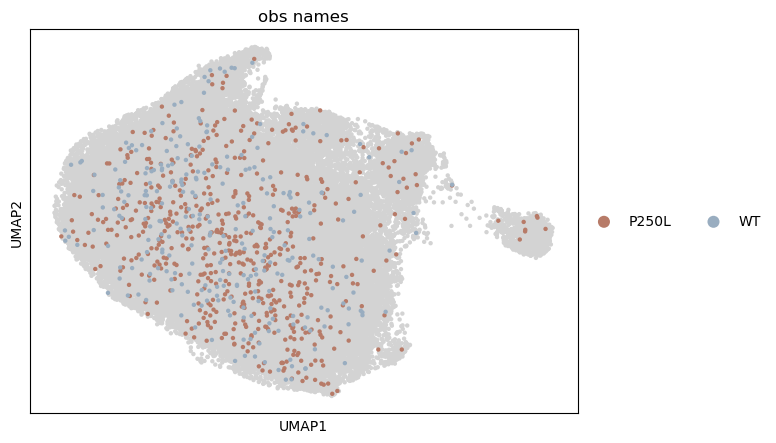

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


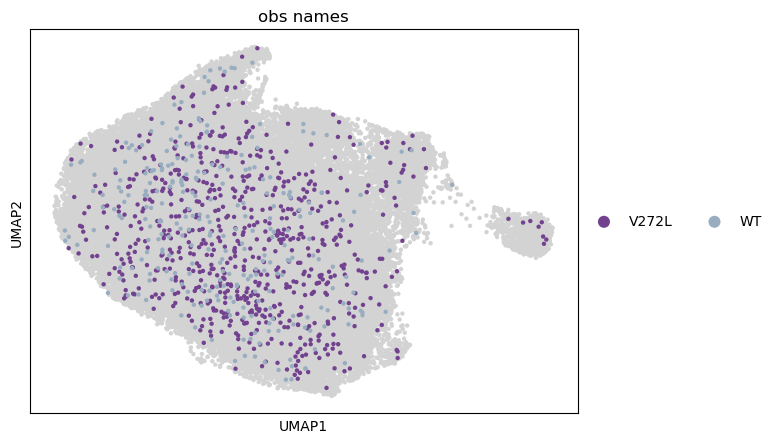

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


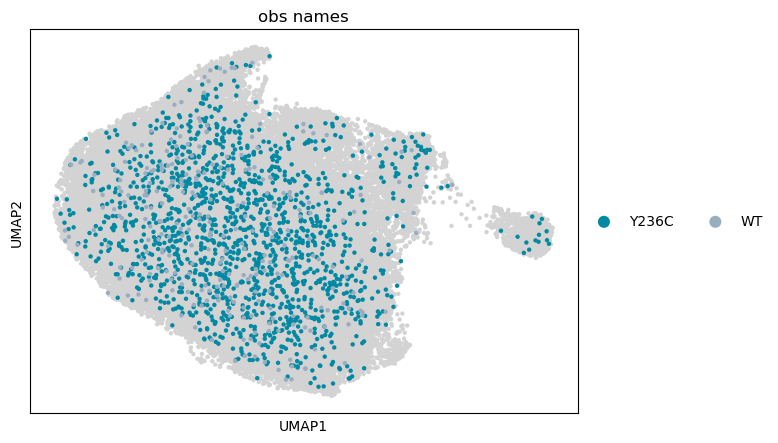

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


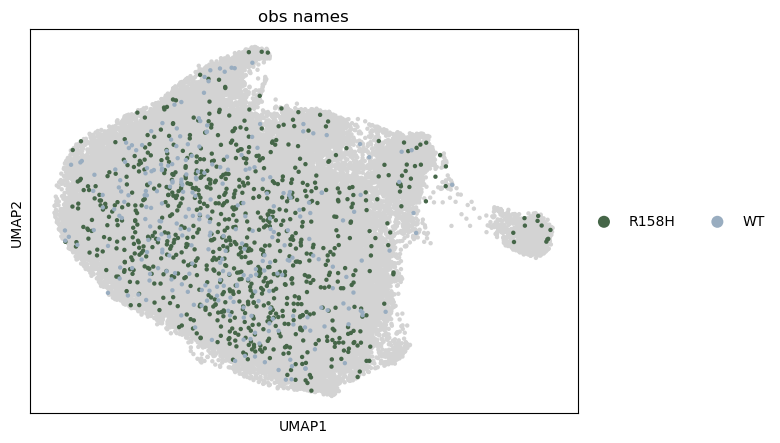

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


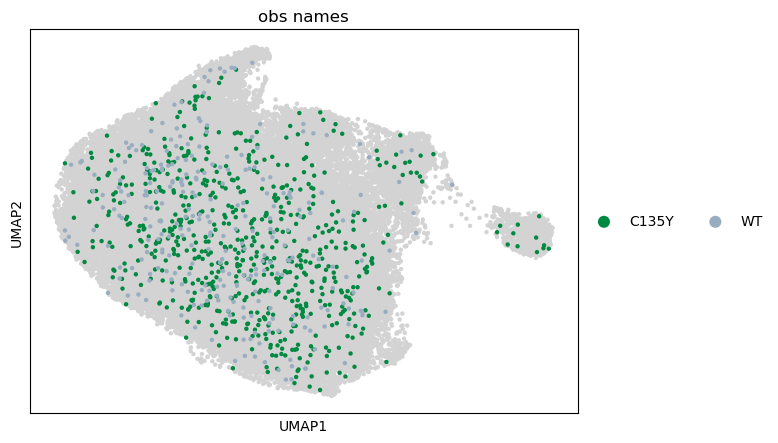

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


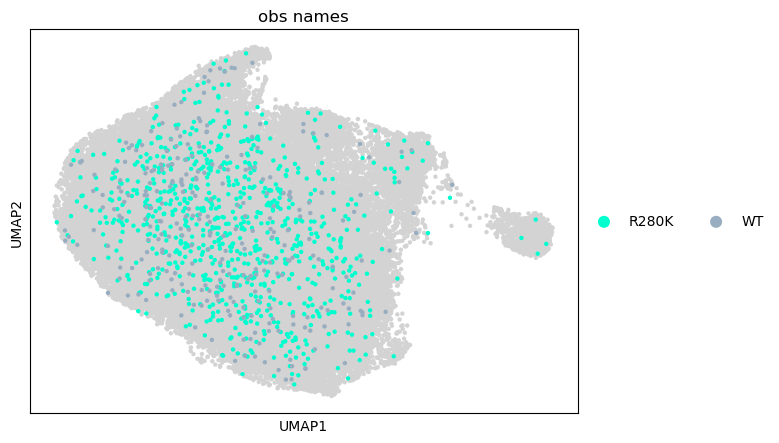

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


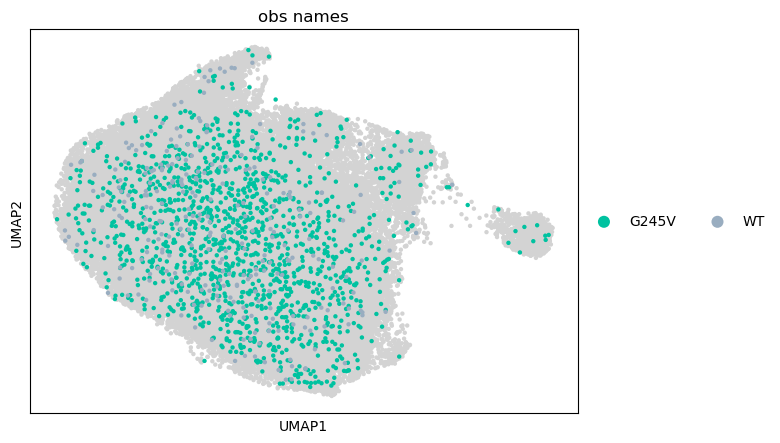

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


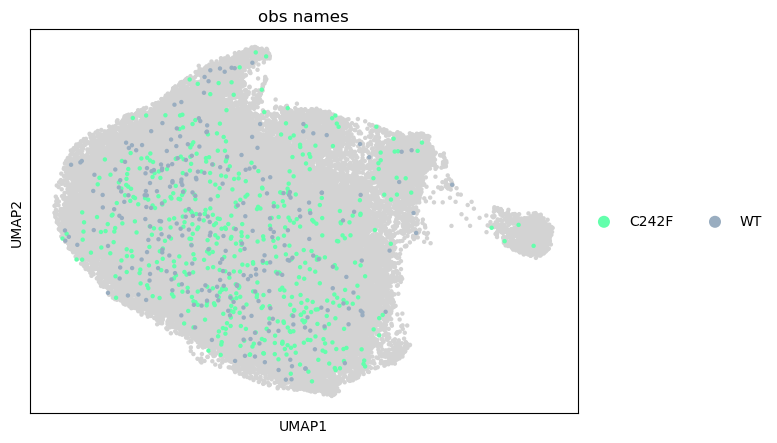

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


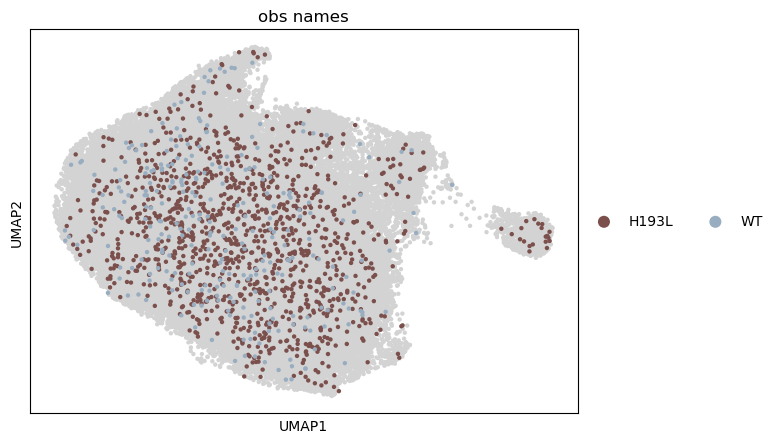

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


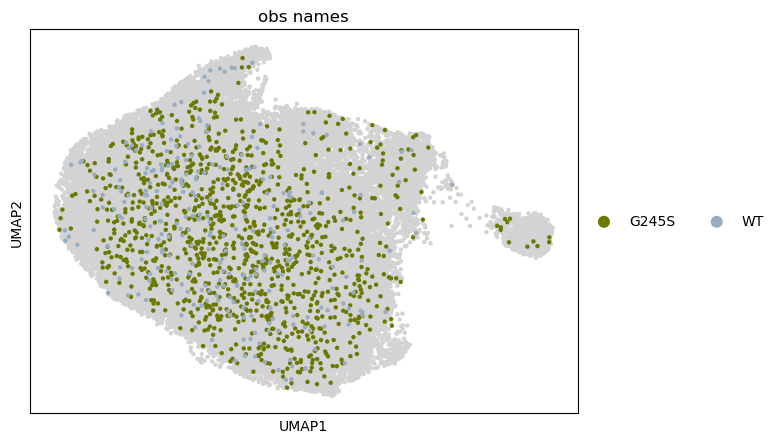

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


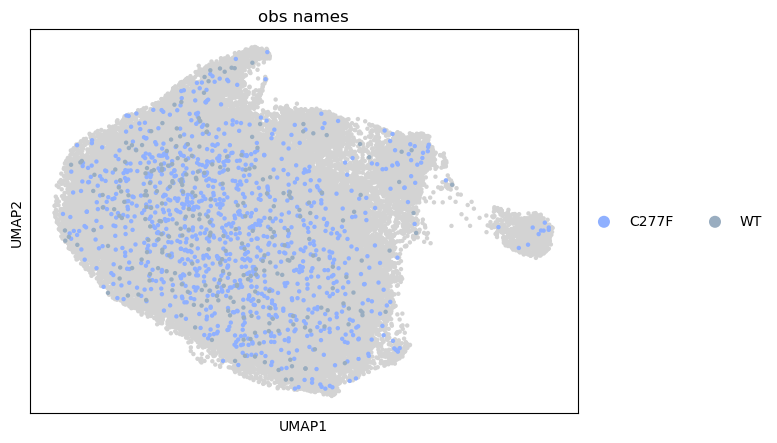

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


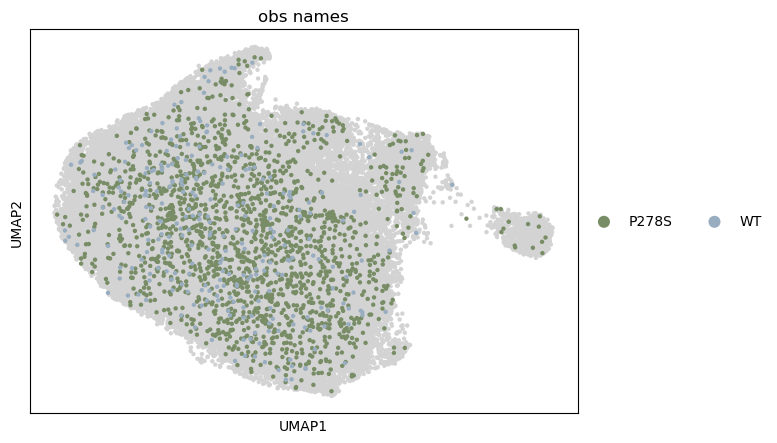

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


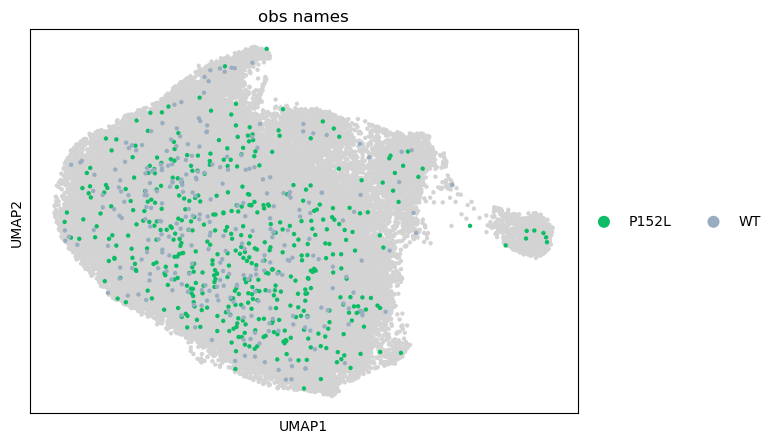

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


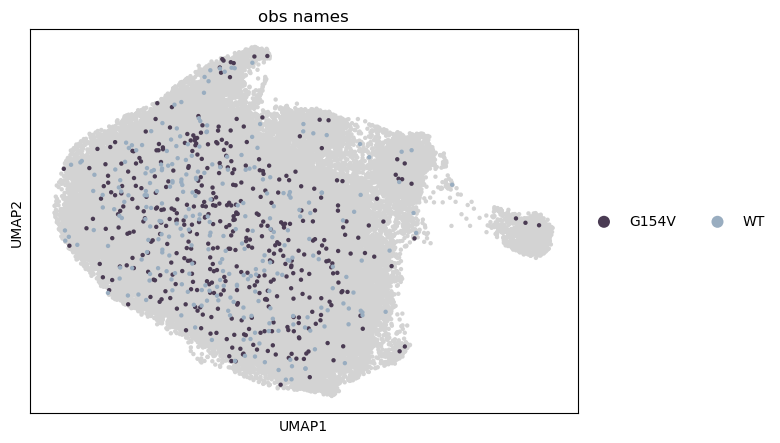

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


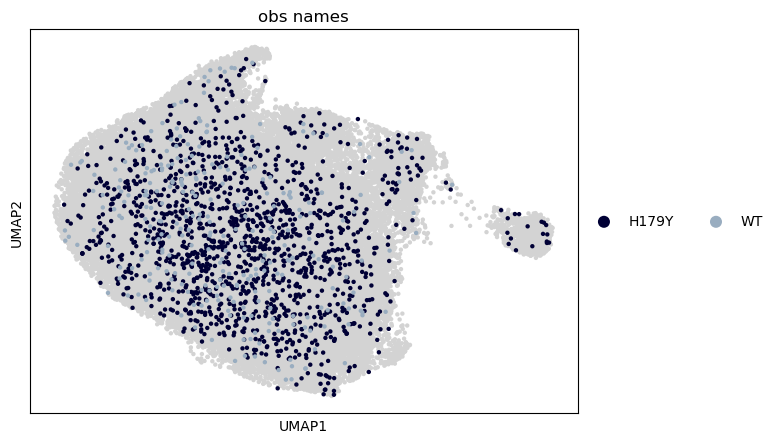

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


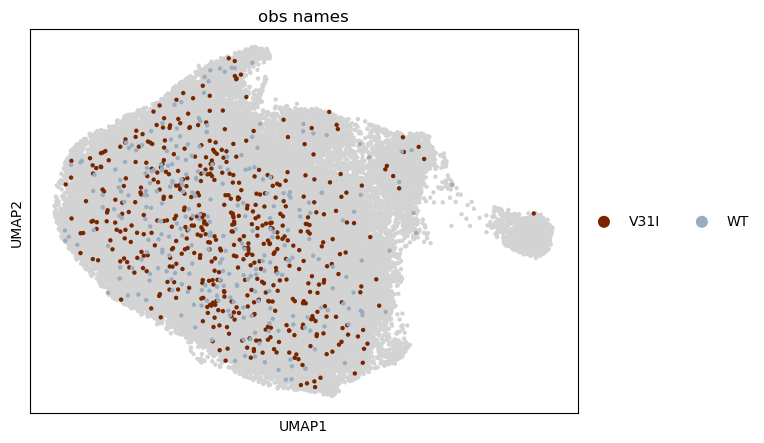

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


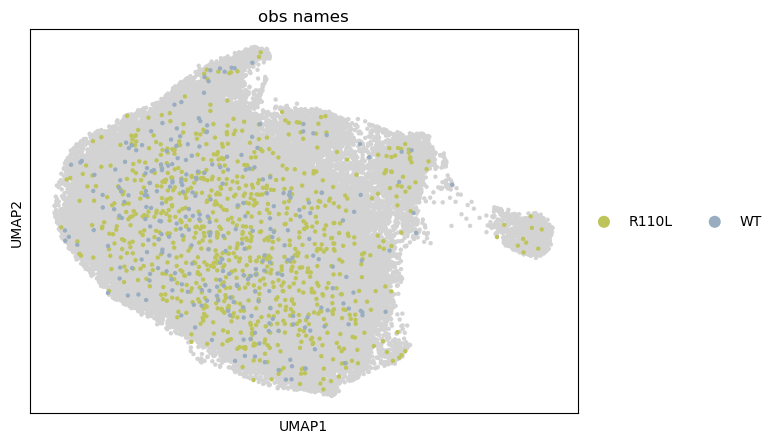

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


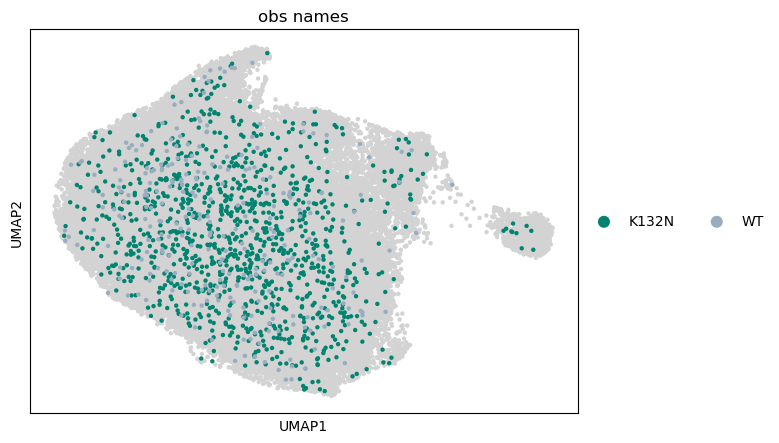

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


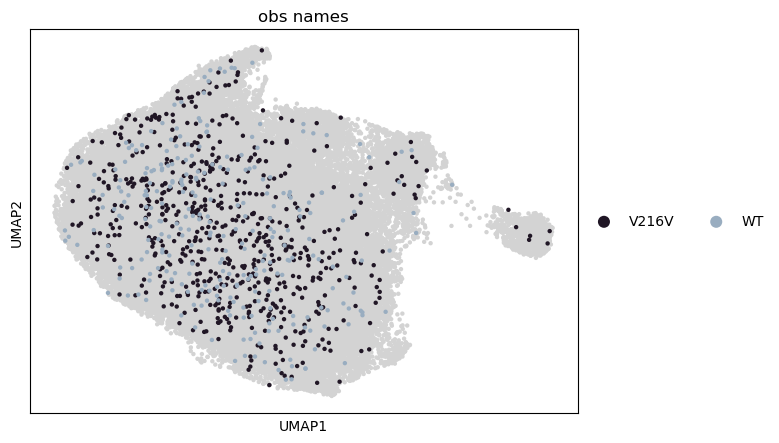

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


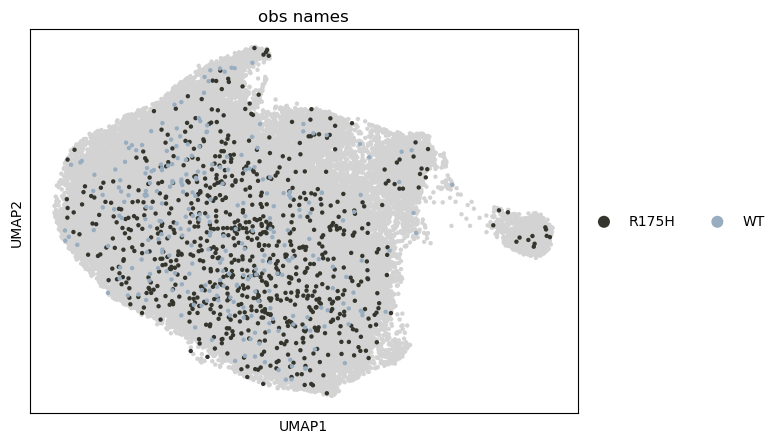

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


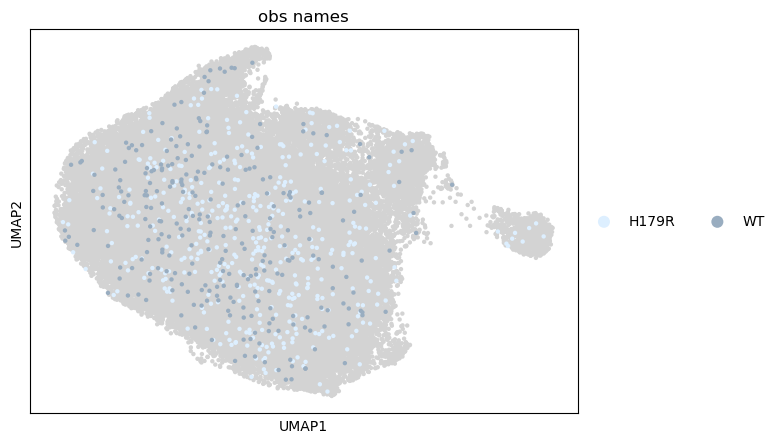

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


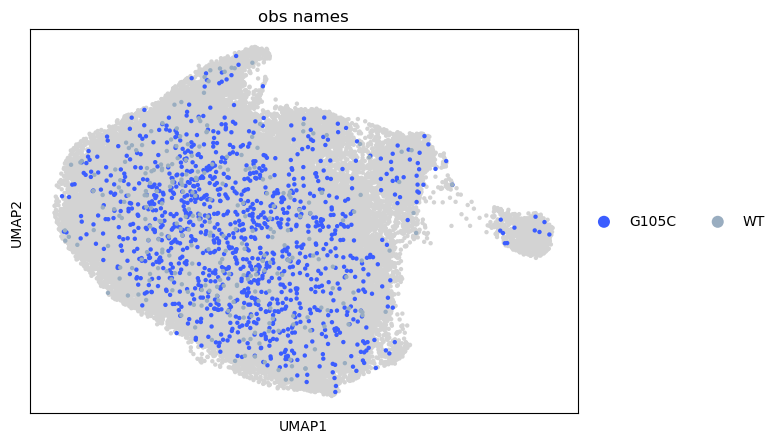

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


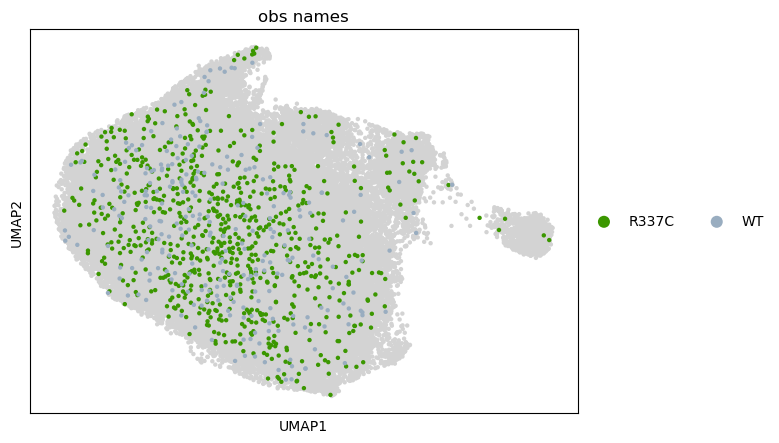

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


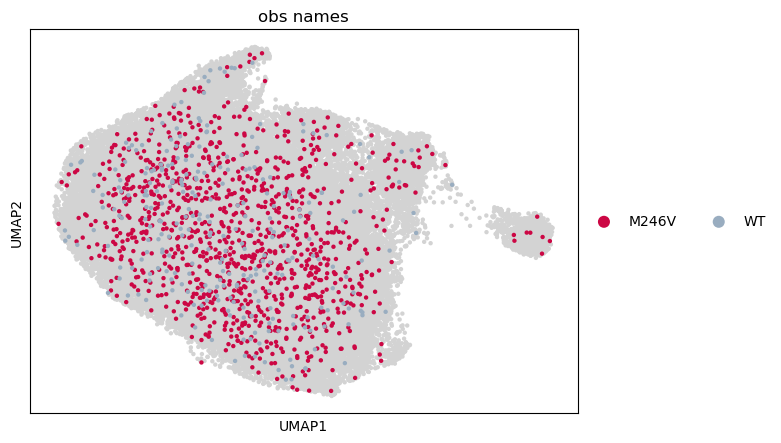

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


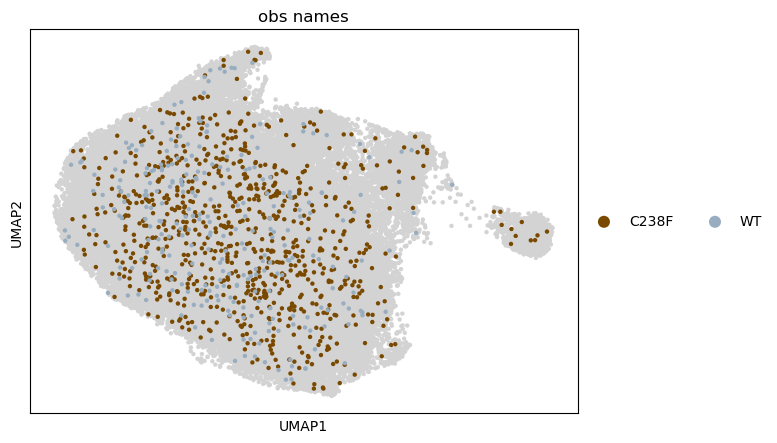

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


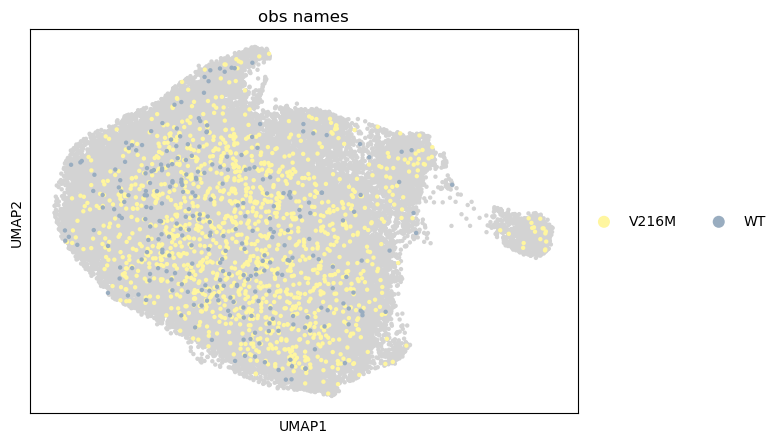

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


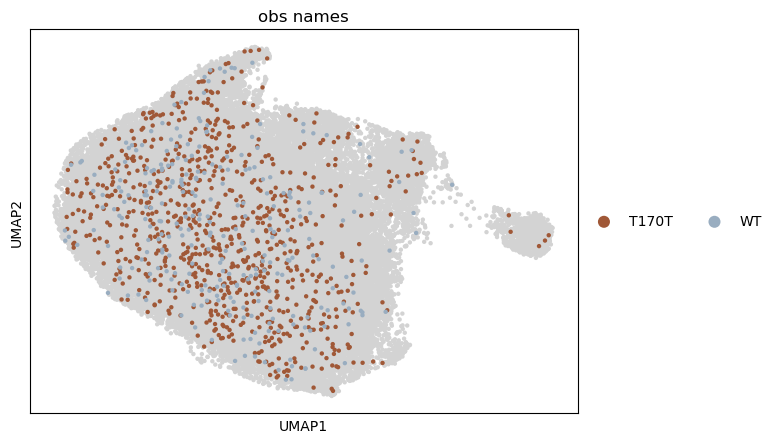

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


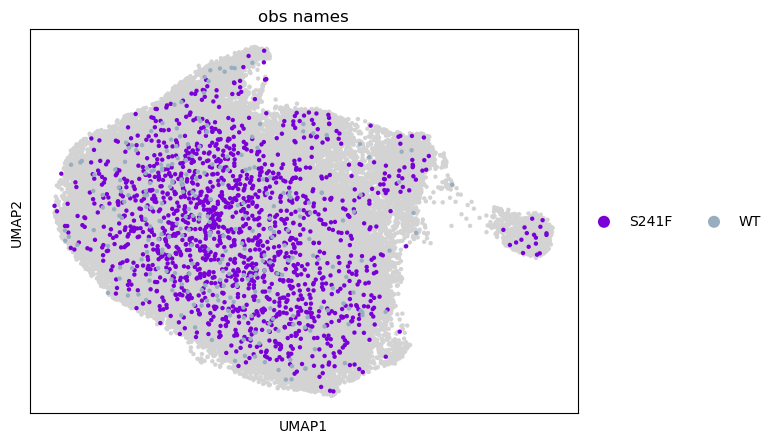

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


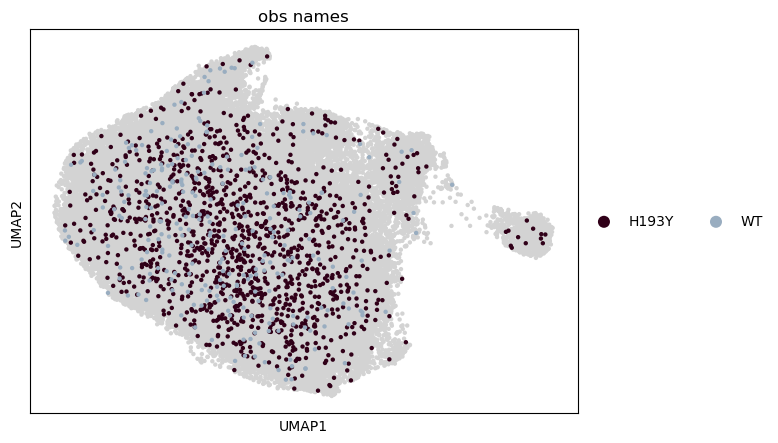

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


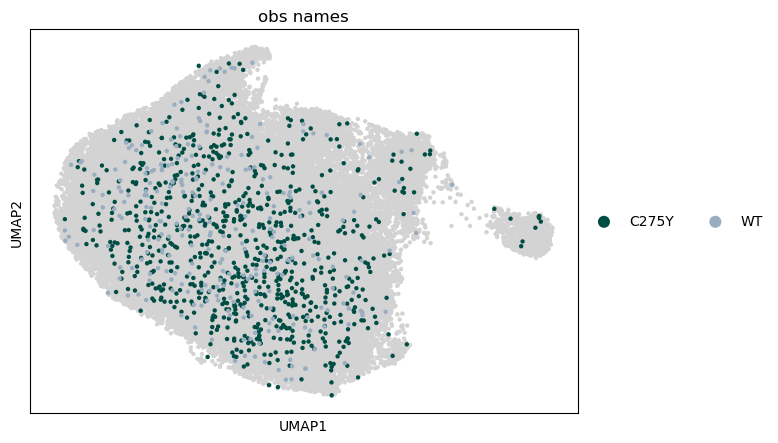

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


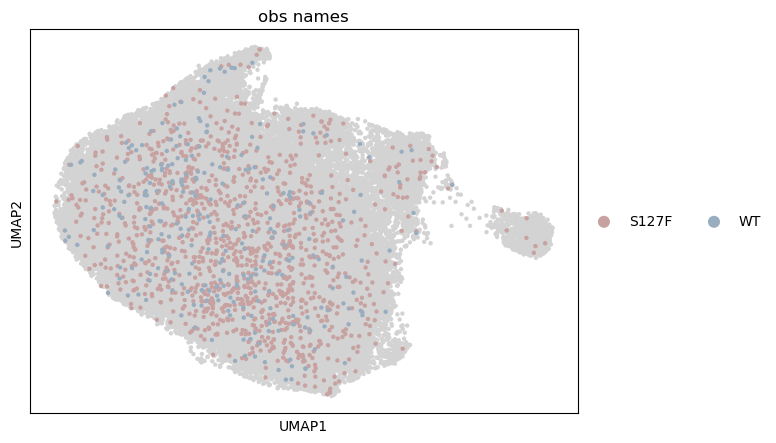

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


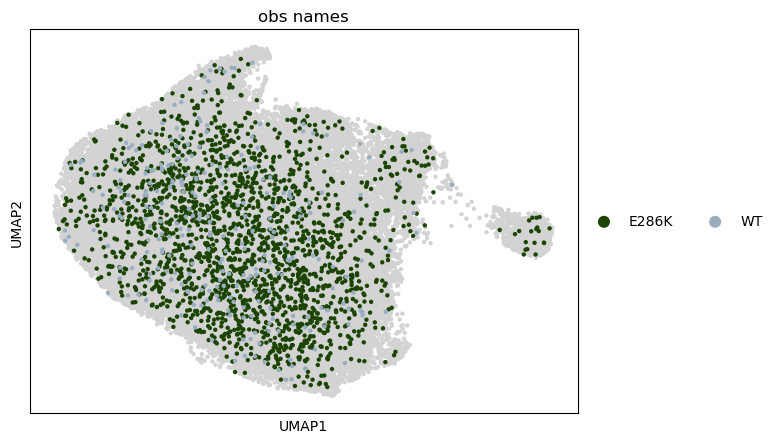

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


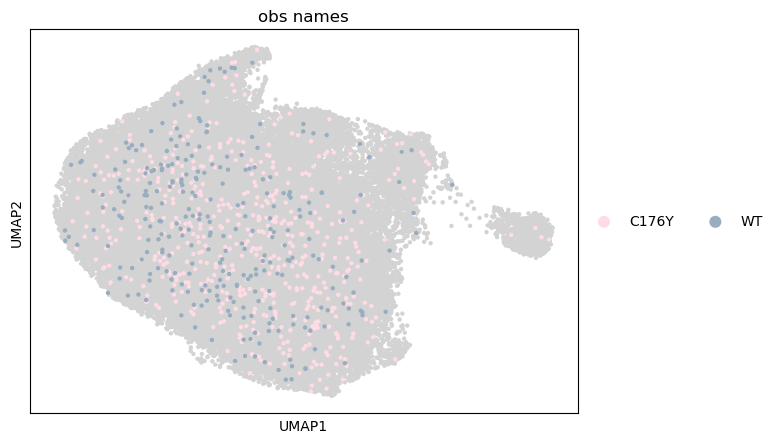

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


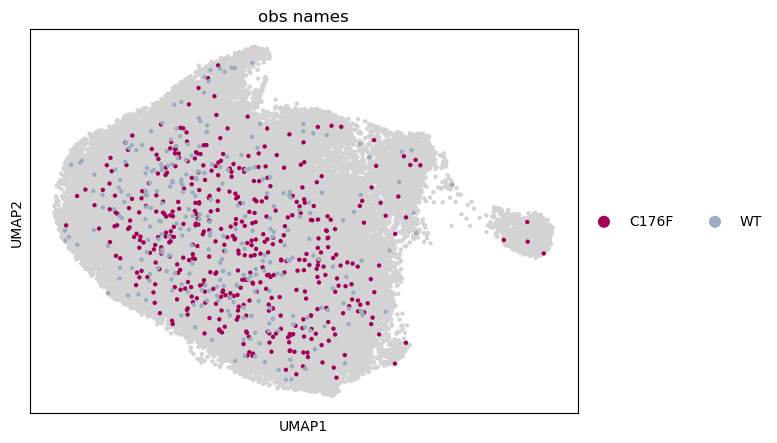

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


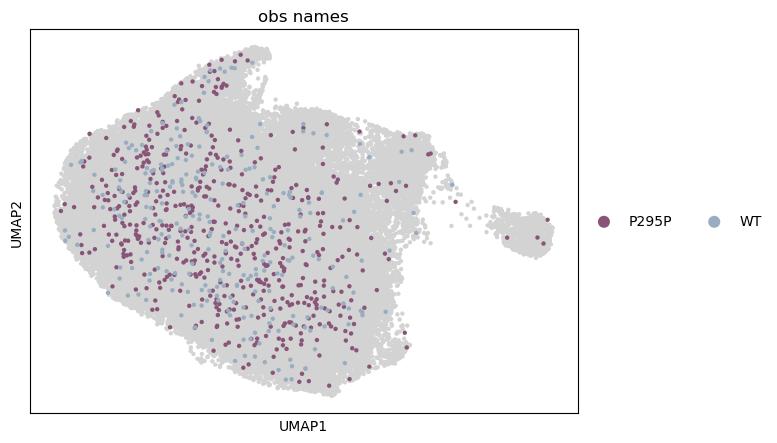

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


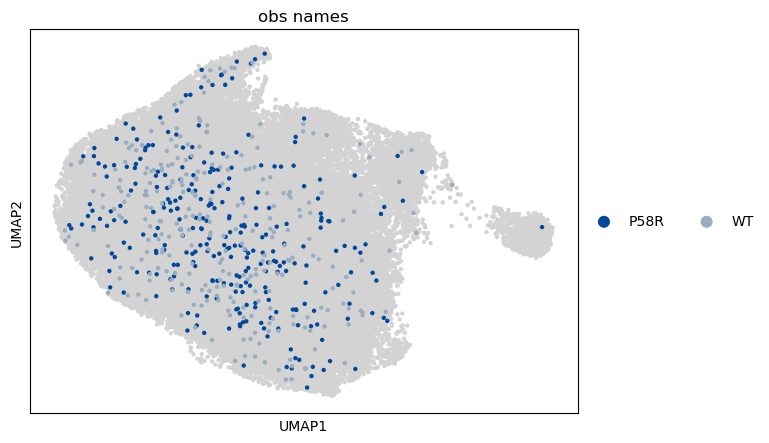

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


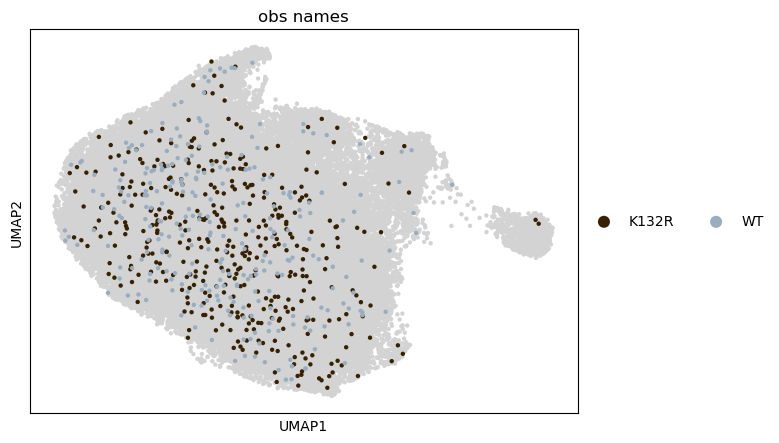

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


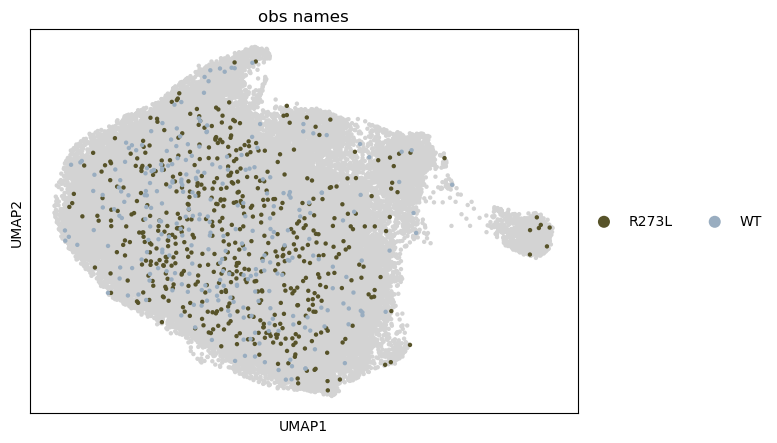

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


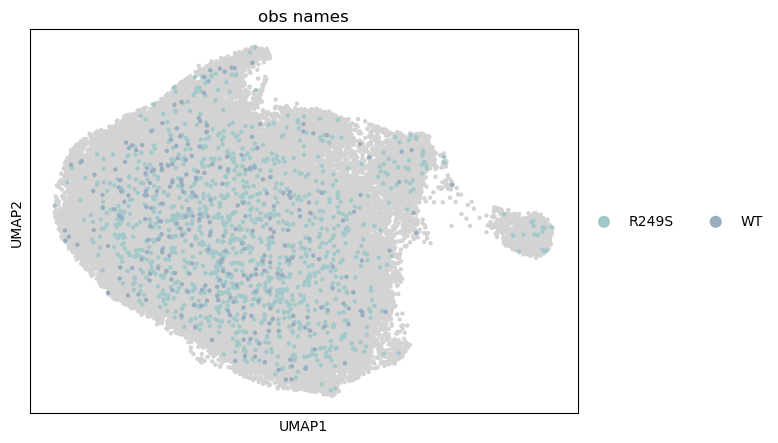

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


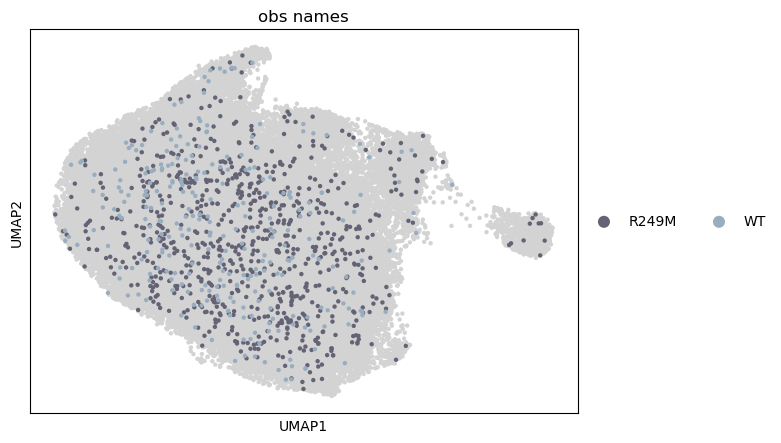

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


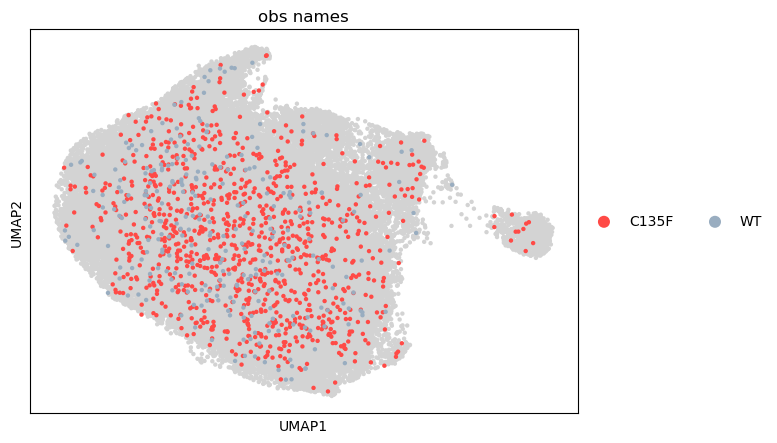

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


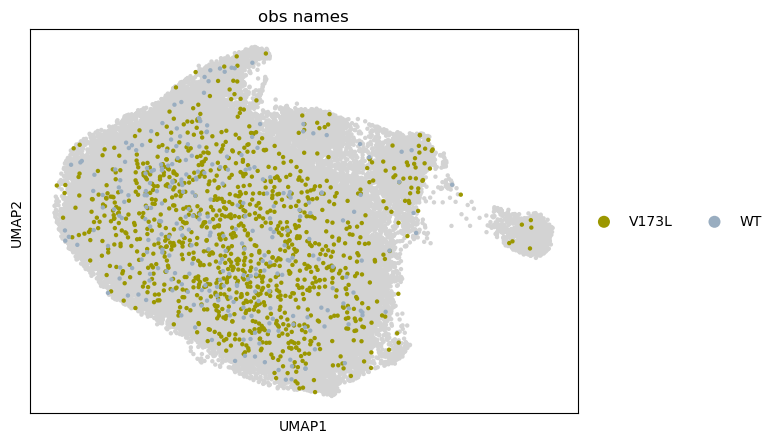

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


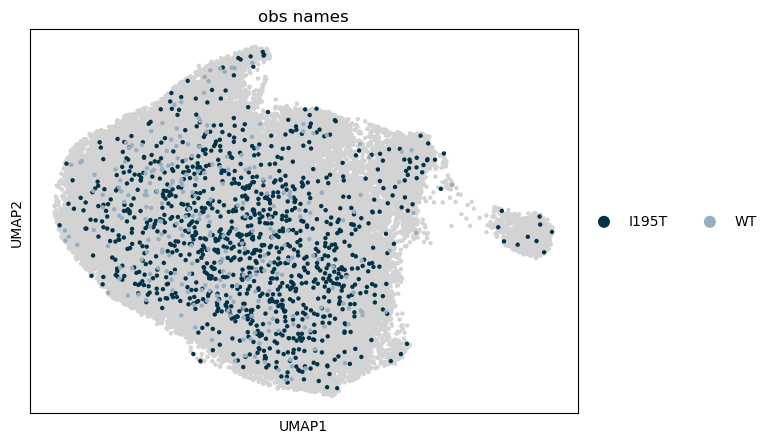

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


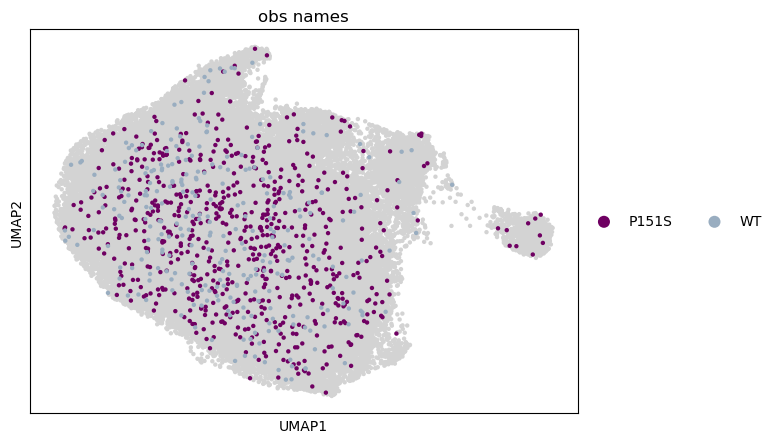

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


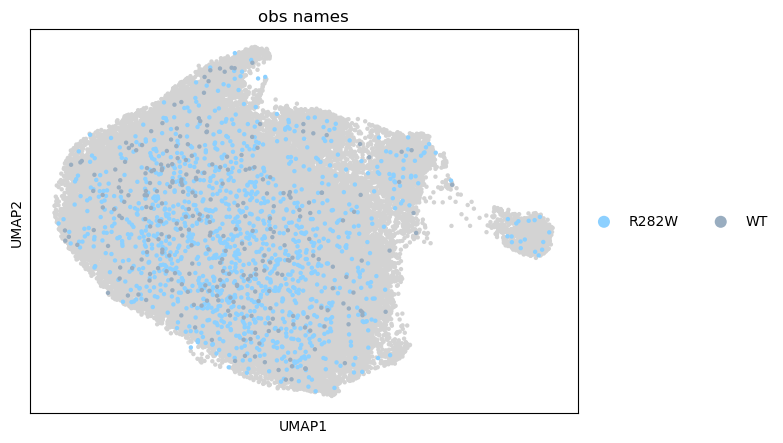

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


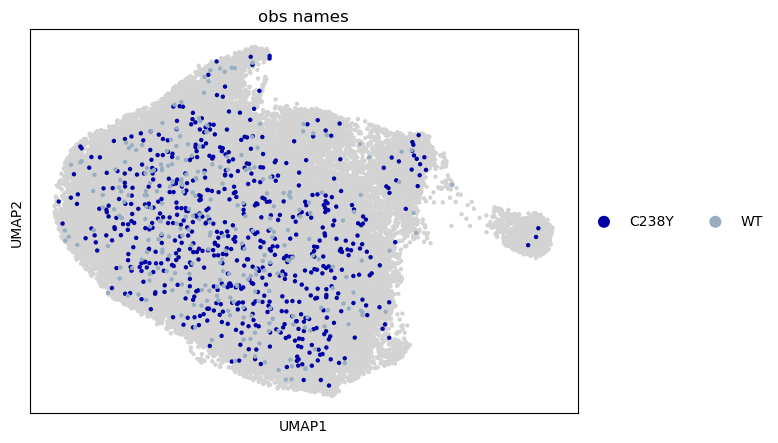

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


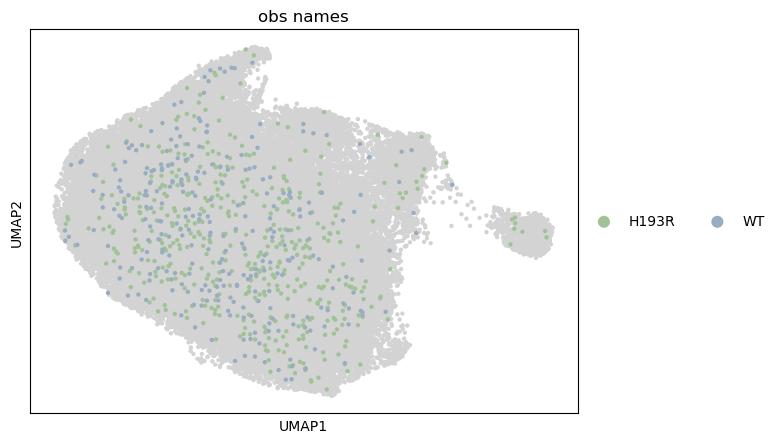

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


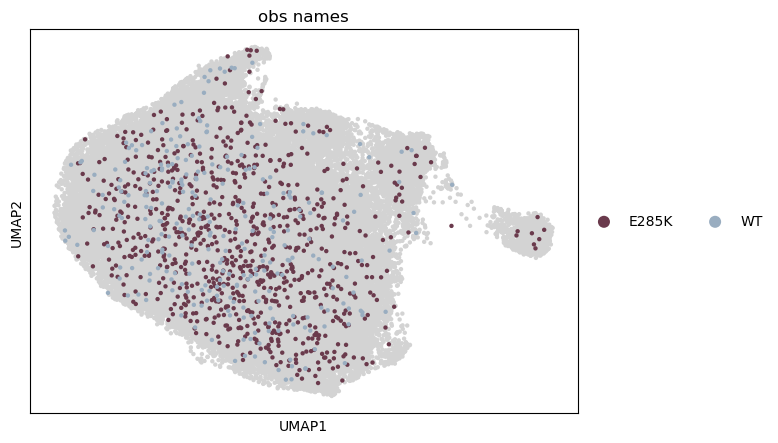

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


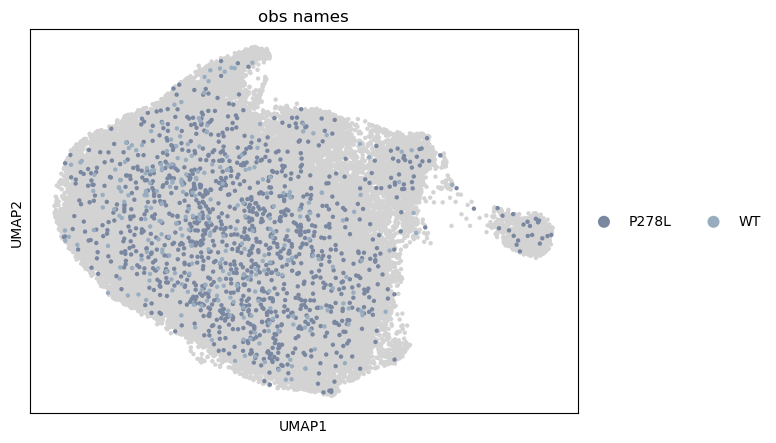

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


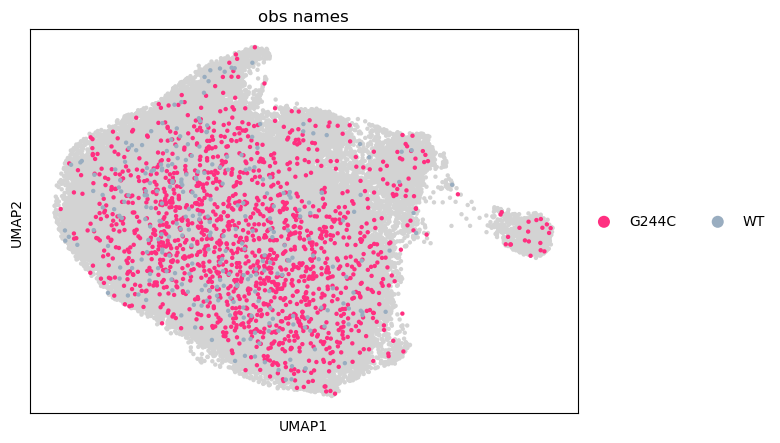

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


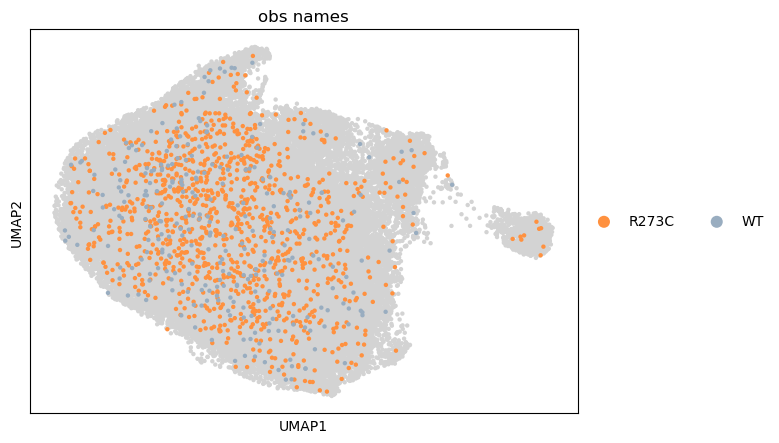

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


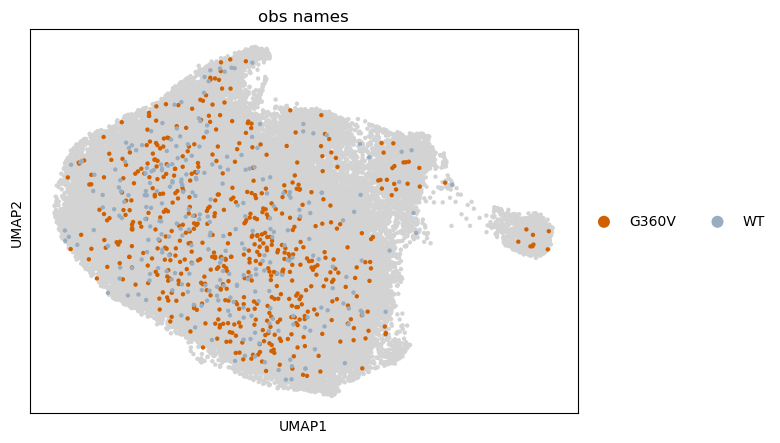

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


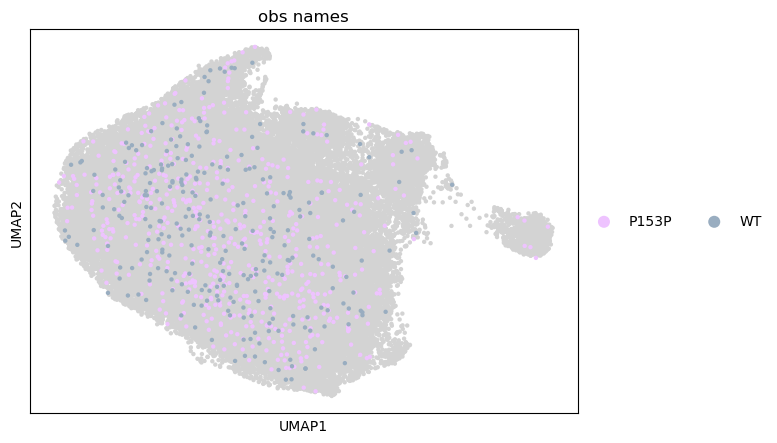

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


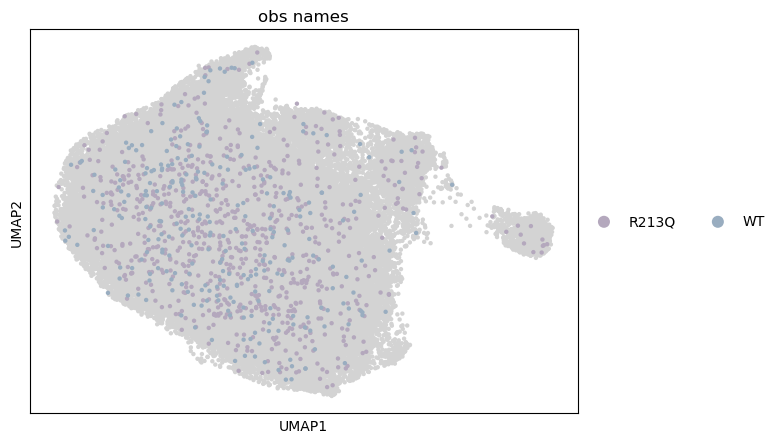

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


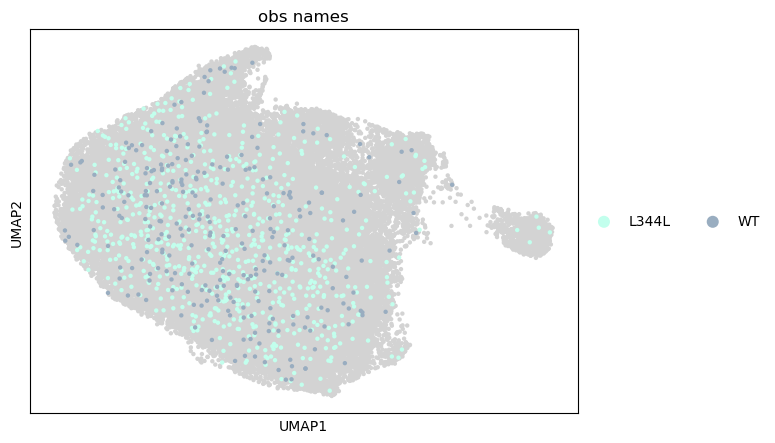

Execution time: 95.314 seconds


In [11]:
# Plot UMAP by variants
pseq.var_umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


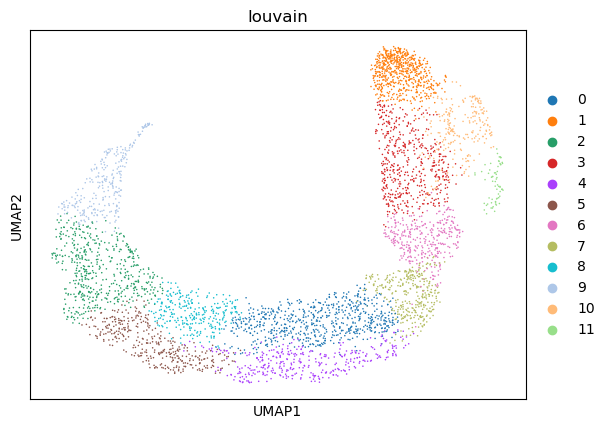

louvain
0     9912
1     9153
2     8277
3     7650
4     7236
5     7128
6     6622
7     5672
8     5615
9     5478
10    4112
11    3522
12    1614
13     820
14     152
Name: count, dtype: int64

Execution time: 41.257 seconds


In [12]:
# Louvain clustering of genes expressions
adata = pseq.louvain_genes(adata)

In [27]:
##### CHECKPOINT: Recover output from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/louvain_data.pkl', 'rb') as file:
    adata = pkl.load(file)
"""

In [14]:
# Saving the genes names (HGNC nomenclature)
with open('var_names.txt', 'w') as file:
    for gene in adata.var['var_names']:
        file.write(gene + '\n')

In [15]:
##### HGNC nomenclature ---> BioMart mapping ---> Ensembl genes ID nomenclature #####

In [16]:
# Fetching the Ensembl genes IDs and checking lost genes during mapping
var_names = pd.read_csv('mart_export.txt', sep = '\t')
display(var_names)
var_dict = var_names.set_index('Gene name').T.to_dict('records')[0]  # Duplicated mappings are removed
print('The %.2f%% of genes were lost during mapping' % (100 - len(var_dict) / len(adata.var['var_names']) * 100))

,Gene stable ID,Gene name
0,ENSG00000198712,MT-CO2
1,ENSG00000198786,MT-ND5
2,ENSG00000198695,MT-ND6
3,ENSG00000198692,EIF1AY
4,ENSG00000291431,DUSP8
...,...,...
4345,ENSG00000162511,LAPTM5
4346,ENSG00000060688,SNRNP40
4347,ENSG00000168528,SERINC2
4348,ENSG00000078900,TP73


The 15.35% of genes were lost during mapping


/tmp/ipykernel_22462/3874717756.py:4: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  var_dict = var_names.set_index('Gene name').T.to_dict('records')[0]  # Duplicated mappings are removed


In [17]:
# Genes not mapped will be linked to the ID 'Null'
mart = []
for var in adata.var['var_names']:
    if var in var_dict.keys(): mart.append(var_dict[var])
    else:                      mart.append('Null')

In [18]:
# Pathway enrichment analysis with gprofiler library
gprofiler_df = pseq.path_gprofiler(adata, mart)

,louvain,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents,intersections,evidences
0,0,KEGG,KEGG:04668,TNF signaling pathway,5.309462e-07,True,TNF signaling pathway,113,253,18,8484,0.071146,0.159292,query_1,[KEGG:00000],"[ENSG00000177606, ENSG00000184371, ENSG0000007...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,0,KEGG,KEGG:04015,Rap1 signaling pathway,6.261527e-06,True,Rap1 signaling pathway,210,253,23,8484,0.090909,0.109524,query_1,[KEGG:00000],"[ENSG00000142627, ENSG00000076864, ENSG0000018...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
2,0,KEGG,KEGG:05200,Pathways in cancer,9.181759e-03,True,Pathways in cancer,527,253,32,8484,0.126482,0.060721,query_1,[KEGG:00000],"[ENSG00000117394, ENSG00000177606, ENSG0000007...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
3,0,KEGG,KEGG:04380,Osteoclast differentiation,1.544220e-02,True,Osteoclast differentiation,132,253,13,8484,0.051383,0.098485,query_1,[KEGG:00000],"[ENSG00000177606, ENSG00000184371, ENSG0000009...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
4,0,KEGG,KEGG:04390,Hippo signaling pathway,2.488535e-02,True,Hippo signaling pathway,157,253,14,8484,0.055336,0.089172,query_1,[KEGG:00000],"[ENSG00000092969, ENSG00000074047, ENSG0000006...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
5,0,KEGG,KEGG:04010,MAPK signaling pathway,2.576861e-02,True,MAPK signaling pathway,301,253,21,8484,0.083004,0.069767,query_1,[KEGG:00000],"[ENSG00000142627, ENSG00000177606, ENSG0000018...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
0,2,KEGG,KEGG:03050,Proteasome,3.021497e-16,True,Proteasome,46,279,20,8484,0.071685,0.434783,query_1,[KEGG:00000],"[ENSG00000126067, ENSG00000143106, ENSG0000015...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,2,KEGG,KEGG:05020,Prion disease,4.663542e-11,True,Prion disease,271,279,36,8484,0.129032,0.132841,query_1,[KEGG:00000],"[ENSG00000117118, ENSG00000126067, ENSG0000014...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
2,2,KEGG,KEGG:05012,Parkinson disease,1.207015e-10,True,Parkinson disease,265,279,35,8484,0.125448,0.132075,query_1,[KEGG:00000],"[ENSG00000117118, ENSG00000126067, ENSG0000014...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
3,2,KEGG,KEGG:05014,Amyotrophic lateral sclerosis,3.984124e-09,True,Amyotrophic lateral sclerosis,363,279,39,8484,0.139785,0.107438,query_1,[KEGG:00000],"[ENSG00000117118, ENSG00000126067, ENSG0000014...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."


Execution time: 5.146 seconds


In [19]:
##### HGNC nomenclature ---> NCBI PubChem tool mapping ---> Entrez ID nomenclature #####

In [36]:
# Fetching the Entrez IDs assigned to each column
with open('entrez.txt', 'r') as file:
    entrez = [line.strip() for line in file.readlines()]
print('The %.2f%% of genes were lost during mapping' % (entrez.count('') / len(adata.var['var_names']) * 100))

The 10.57% of genes were lost during mapping


In [37]:
# Pathway enrichment analysis with goatools library
goatools_df = pseq.path_goatools(adata, entrez)

  EXISTS: gene2go
  EXISTS: go-basic.obo
go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
HMS:0:01:08.245385 347,563 annotations, 20,771 genes, 18,739 GOs, 1 taxids READ: gene2go 

Load BP Ontology Enrichment Analysis ...
  0%      0 of  4,579 population items found in association

Load CC Ontology Enrichment Analysis ...
  0%      0 of  4,579 population items found in association

Load MF Ontology Enrichment Analysis ...
  0%      0 of  4,579 population items found in association

Runing BP Ontology Analysis: current study set of 240 IDs.
  0%      0 of      0 study items found in association
  0%      0 of    240 study items found in population(4579)

Runing CC Ontology Analysis: current study set of 240 IDs.
  0%      0 of      0 study items found in association
  0%      0 of    240 study items found in population(4579)

Runing MF Ontology Analysis: current study set of 240 IDs.
  0%      0 of      0 study items found in association
  0%      0 of    240 study items found in pop

,GO,term,class,p,p_corr,n_genes,louvain


Execution time: 69.516 seconds


In [38]:
# Next function takes a lot of time! Therefore, as an example, only 20 variants will be selected to be statistical analyzed again WT
obs_list = list(set(adata.obs['obs_names']))[:10] + ['WT']
obs_names = []
for variant in adata.obs['obs_names']:
    if variant in obs_list: obs_names.append(variant)
    else:                   obs_names.append('Null')  # 'Null' variants are automatically skipped by the function
if len(adata.obs['obs_names']) == len(obs_names): adata.obs['obs_names'] = obs_names
else: print('Problem with new variants list length!')

In [39]:
# Differential expression analysis (DEA) with the library PyDESeq2, a Python implementation of the DESeq2 method in R
adata_dict = pseq.diff_analysis(adata)

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.13 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs R273H
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.479256       -0.021353  0.189472 -0.112698  0.910270       NaN
HES4         0.827868       -0.269644  0.152295 -1.770542  0.076637  0.255392
ISG15        0.118566        0.176205  0.382151  0.461086  0.644737       NaN
CPSF3L       0.173517       -0.124400  0.300994 -0.413299  0.679388       NaN
MIB2         0.192156        0.167749  0.264653  0.633845  0.526182       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.922599        0.006336  0.056986  0.111189  0.911466  0.969178
MT-ND6       4.034059       -0.016956  0.080844 -0.209741  0.833870  0.930722
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.126366       -0.005742  0.398120 -0.014424  0.988492       NaN
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.12 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs S241C
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.521975       -0.154108  0.189291 -0.814135  0.415568  0.635242
HES4         0.801221       -0.147442  0.158315 -0.931320  0.351688  0.587088
ISG15        0.158382        0.038742  0.337747  0.114706  0.908678       NaN
CPSF3L       0.171348       -0.090040  0.308524 -0.291842  0.770407       NaN
MIB2         0.211665        0.108628  0.260771  0.416567  0.676995       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.440260        0.107236  0.057310  1.871168  0.061322  0.242489
MT-ND6       3.836013        0.130922  0.084495  1.549474  0.121268  0.327581
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.129788        0.013343  0.377187  0.035374  0.971781       NaN
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.22 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs G266V
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.553741       -0.175201  0.176838 -0.990742  0.321811  0.560977
HES4         0.874134       -0.276361  0.149826 -1.844552  0.065103  0.212064
ISG15        0.125252        0.175155  0.367320  0.476846  0.633472       NaN
CPSF3L       0.192475       -0.142409  0.253932 -0.560814  0.574924       NaN
MIB2         0.224600        0.102482  0.231036  0.443574  0.657351       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      15.118504        0.047241  0.052612  0.897901  0.369238  0.603229
MT-ND6       3.895654        0.119331  0.077954  1.530786  0.125822  0.320491
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.153156       -0.040789  0.317922 -0.128298  0.897913       NaN
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.14 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs R158R
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.502930       -0.055100  0.191806 -0.287267  0.773908  0.999985
HES4         0.849639       -0.281193  0.155779 -1.805072  0.071063  0.999985
ISG15        0.143871        0.105218  0.357057  0.294681  0.768238  0.999985
CPSF3L       0.180378       -0.106593  0.300633 -0.354560  0.722919  0.999985
MIB2         0.239476        0.029082  0.244291  0.119048  0.905237  0.999985
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.847090        0.035586  0.057196  0.622178  0.533825  0.999985
MT-ND6       4.077433       -0.011119  0.083909 -0.132509  0.894581  0.999985
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.135455       -0.012521  0.384051 -0.032603  0.973991  0.999985
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.09 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs C141Y
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.500978       -0.097032  0.207151 -0.468412  0.639490  0.834407
HES4         0.850366       -0.381870  0.179479 -2.127663  0.033365  0.176592
ISG15        0.118478        0.252082  0.442583  0.569569  0.568970       NaN
CPSF3L       0.159917       -0.067363  0.351993 -0.191375  0.848232       NaN
MIB2         0.236405        0.044146  0.257333  0.171551  0.863790       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.928288        0.001837  0.060107  0.030556  0.975623  0.983694
MT-ND6       3.672783        0.215818  0.092009  2.345615  0.018996  0.118399
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.122922        0.045783  0.433714  0.105560  0.915931       NaN
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.13 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs V173M
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.538663       -0.216682  0.181707 -1.192482  0.233072  0.481428
HES4         0.844235       -0.300846  0.153299 -1.962485  0.049706  0.191724
ISG15        0.138181        0.122274  0.364155  0.335774  0.737041       NaN
CPSF3L       0.201228       -0.249200  0.274448 -0.908004  0.363876       NaN
MIB2         0.201025        0.135721  0.264113  0.513874  0.607340       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.243297        0.112808  0.056194  2.007482  0.044698  0.179606
MT-ND6       3.784838        0.138729  0.080618  1.720820  0.085283  0.265893
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.141750       -0.005901  0.361349 -0.016329  0.986972       NaN
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.20 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs G266E
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.533319       -0.145053  0.175617 -0.825961  0.408826  0.739873
HES4         0.818558       -0.180496  0.147163 -1.226508  0.220007  0.573376
ISG15        0.124700        0.167175  0.358023  0.466938  0.640544       NaN
CPSF3L       0.188441       -0.120075  0.275023 -0.436601  0.662401       NaN
MIB2         0.197453        0.168786  0.254956  0.662019  0.507959       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.714747        0.071847  0.053381  1.345940  0.178322  0.515392
MT-ND6       3.730590        0.170502  0.075323  2.263604  0.023598  0.154814
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.133815        0.006981  0.348181  0.020050  0.984004       NaN
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.07 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs E339K
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.504206        0.007883  0.208250  0.037852  0.969806  0.999953
HES4         0.857805       -0.341834  0.184253 -1.855241  0.063562  0.999953
ISG15        0.126396        0.238707  0.418240  0.570741  0.568175  0.999953
CPSF3L       0.160641       -0.008602  0.372722 -0.023080  0.981587  0.999953
MIB2         0.245270        0.019254  0.274501  0.070140  0.944082  0.999953
...               ...             ...       ...       ...       ...       ...
MT-ND5      15.307465        0.025453  0.065718  0.387313  0.698524  0.999953
MT-ND6       4.055451        0.058187  0.095964  0.606341  0.544289  0.999953
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.129256        0.090292  0.442425  0.204083  0.838288  0.999953
AC24

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.09 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs P36P
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.530878       -0.195818  0.199171 -0.983168  0.325525  0.999938
HES4         0.797693       -0.187814  0.164743 -1.140041  0.254269  0.999938
ISG15        0.133563        0.167160  0.368828  0.453219  0.650391  0.999938
CPSF3L       0.158538       -0.065087  0.337625 -0.192780  0.847131  0.999938
MIB2         0.234236        0.039577  0.253603  0.156059  0.875987  0.999938
...               ...             ...       ...       ...       ...       ...
MT-ND5      14.963815        0.026224  0.059523  0.440572  0.659523  0.999938
MT-ND6       3.944640        0.053709  0.085298  0.629666  0.528913  0.999938
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.146760       -0.055375  0.358618 -0.154412  0.877285  0.999938
AC240

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example2/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.18 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n 

Log2 fold change & Wald test p-value: obs-names WT vs G266R
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                    
SAMD11       0.541070       -0.264830  0.172261 -1.537375  0.124201  0.328944
HES4         0.828873       -0.290975  0.145263 -2.003093  0.045167  0.175252
ISG15        0.110347        0.193699  0.395342  0.489953  0.624167       NaN
CPSF3L       0.189950       -0.178165  0.263060 -0.677277  0.498230       NaN
MIB2         0.219563        0.059768  0.228664  0.261380  0.793800       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND5      15.103015       -0.023377  0.054672 -0.427587  0.668952  0.817299
MT-ND6       3.765397        0.109649  0.079169  1.384991  0.166055  0.385111
AC136612.1   0.000000             NaN       NaN       NaN       NaN       NaN
AC007325.4   0.130449       -0.025363  0.363458 -0.069782  0.944367       NaN
AC24

In [40]:
##### CHECKPOINT: Recover outpout from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/diff_analysis/diff_analysis.pkl', 'rb') as file:
    adata_dict = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/diff_analysis/diff_analysis.pkl', 'rb') as file:\n    adata_dict = pkl.load(file)\n"

For a higher resolution of a particular variant, type returned_dict[variant].plot_MA(s=5)
Execution time: 6.181 seconds


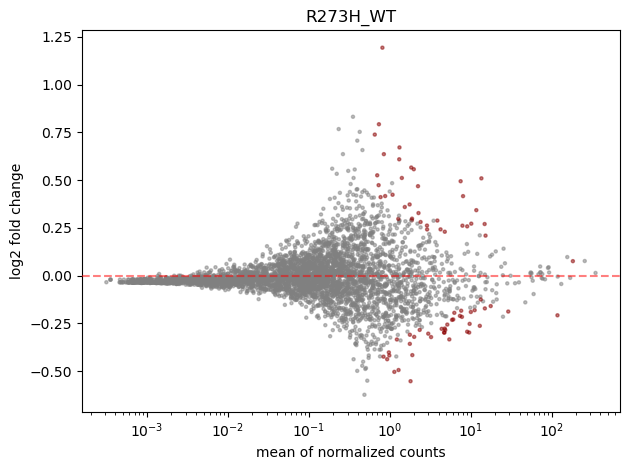

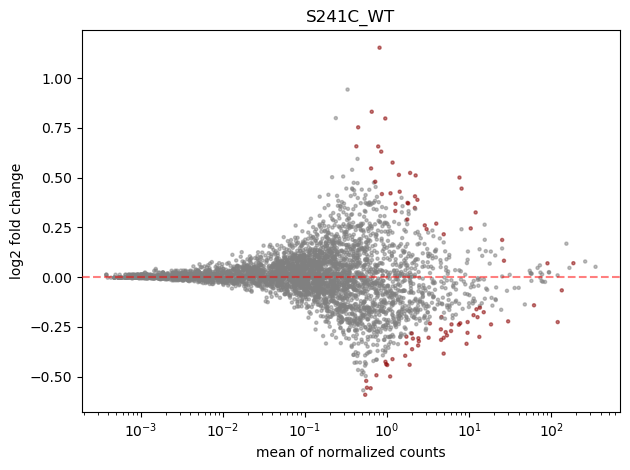

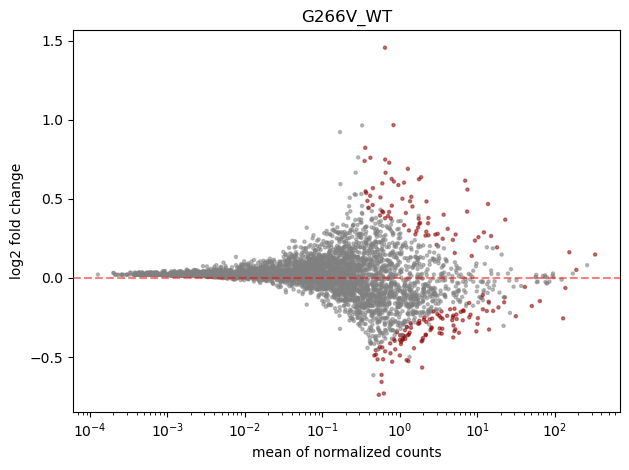

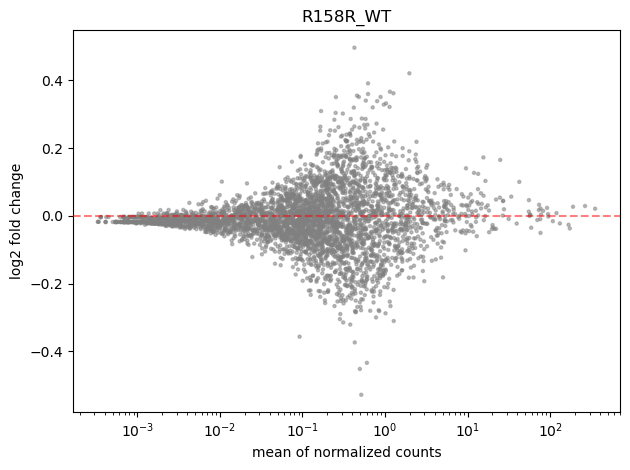

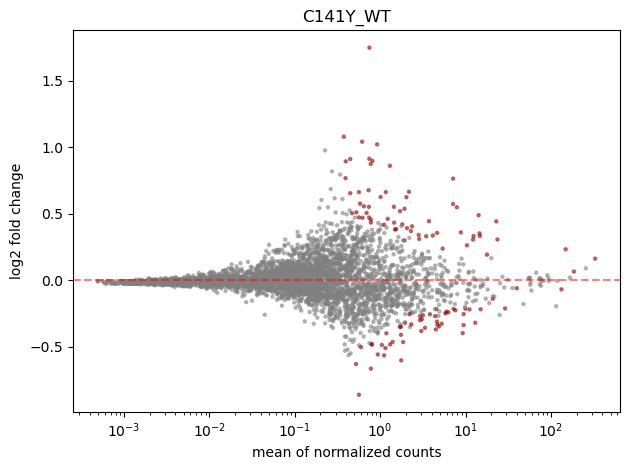

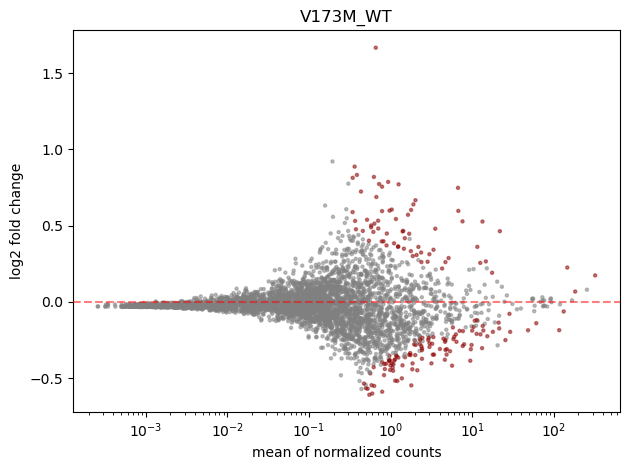

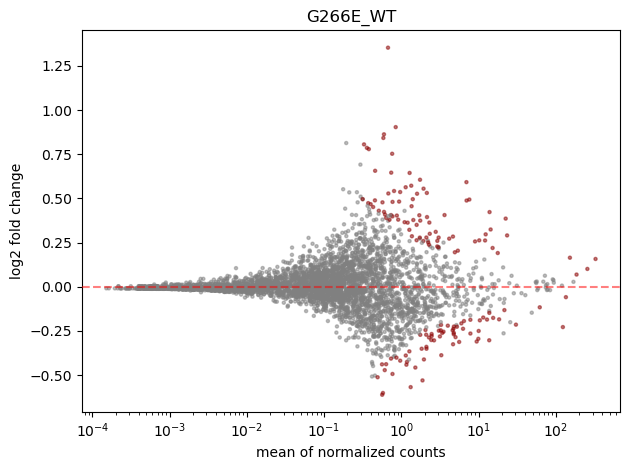

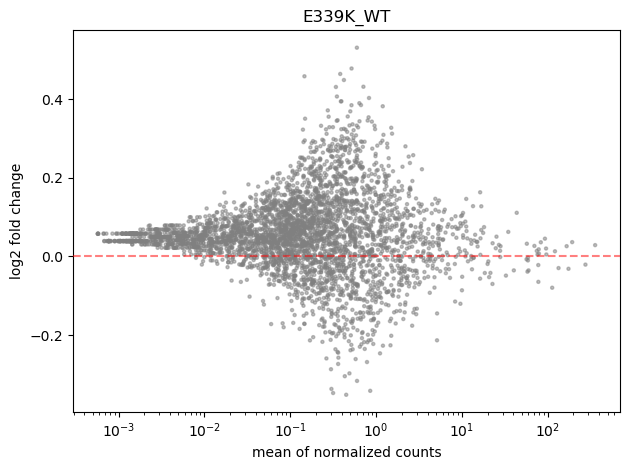

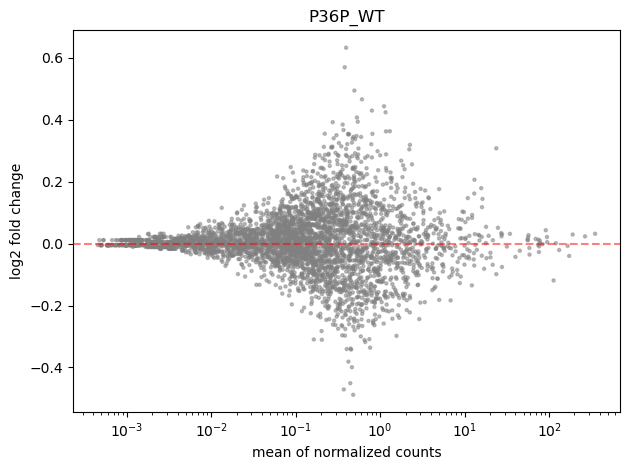

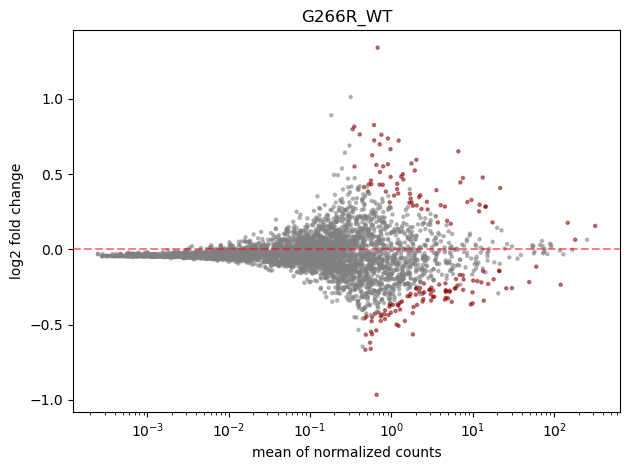

In [41]:
# Plotting the DEA
pseq.plot_dea(adata_dict)